In [114]:
# coding: utf-8
import pandas as pd
from pandas import Series,DataFrame
import numpy as np
import itertools

import matplotlib.pyplot as plt
%matplotlib inline
from collections import Counter
import re
import datetime as dt
from datetime import date
from datetime import datetime

import requests
from bs4 import BeautifulSoup

import string
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from string import punctuation
from nltk.tokenize import TweetTokenizer
from nltk import tokenize

from wordcloud import WordCloud
from PIL import Image

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion
from sklearn.cross_validation import cross_val_score
from sklearn.cross_validation import StratifiedKFold
from sklearn.grid_search import GridSearchCV
from sklearn.cluster import MiniBatchKMeans

from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.preprocessing import scale
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.feature_selection import SelectPercentile

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc,precision_score, accuracy_score, recall_score, f1_score
from scipy import interp

import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.plotting import figure, show, output_notebook
from bokeh.io import push_notebook, show, output_notebook
import bokeh.plotting as bplt

import lda
import pyLDAvis
import pyLDAvis.gensim

import warnings
warnings.filterwarnings("ignore")
import logging

import gensim
from gensim import corpora, models, similarities
from gensim.models.word2vec import Word2Vec 
from gensim.models.doc2vec import Doc2Vec,TaggedDocument
from gensim.models.ldamodel import LdaModel

from copy import deepcopy
from pprint import pprint

from keras.models import Sequential
from keras.layers import Dense, Dropout, SimpleRNN, LSTM, Activation
from keras.callbacks import EarlyStopping
from keras.preprocessing import sequence

import pickle
import os

#print(os.getcwd())

In [3]:
# Importing tweets from csv into dataframe
# (wczytanie danych tweetow z csv do ramki)

try:
    tweets = pd.read_csv('bezrobocie_tweets_15.08.2017.csv', names = ['username', 'date', 'retweets', 'favorites', 'text', 'geo', 'mentions', 'hashtags', 'id', 'permalink'], sep=";", 
                         skiprows=1, encoding='utf-8')
except ValueError as exc:
    raise ParseError('CSV parse error - %s', parser_context=None)

print(tweets.head())
tweets.text[1]

          username              date  retweets  favorites  \
0  Fil_Stankiewicz  2017-08-15 23:19         0          0   
1         comparic  2017-08-15 22:41         0          0   
2     Macronextcom  2017-08-15 22:41         0          0   
3     HalinkaMaria  2017-08-15 20:19         1          2   
4      KrystianU73  2017-08-15 18:41         0          0   

                                                text  geo mentions  \
0  Ja oceniam fakty - bezrobocie , deficyt maleje...  NaN      NaN   
1  Macronextcom informuje: W środę w #kalendarium...  NaN      NaN   
2  W środę w #kalendarium m.in. minutki #FOMC , P...  NaN      NaN   
3  Tu i teraz to male bezrobocie ,duzo mniejsza k...  NaN      NaN   
4  no ba... a za Gierka to się ludziom żyło! I be...  NaN      NaN   

                      hashtags                  id  \
0                          NaN  897568438905909248   
1       #kalendarium #FOMC #UK  897558901368922113   
2  #kalendarium #FOMC #UK #USA  897558865452998656

'Macronextcom informuje: W środę w #kalendarium m.in. minutki #FOMC , PKB w Polsce i Eurolandzie, bezrobocie w #UK ,… http://www. macronext.com/pl/dane-makro/ d/2017-08-16/c/0 … ""'

In [5]:
# Removing duplicates from dataframe
# (usuniecie duplikatow tweetow z ramki)
#print('before', len(tweets)) # 21069 

tweets.drop_duplicates(['text'], inplace=True)
print(len(tweets)) # 20803 

20803


In [6]:
# Separating the time variable by hour, day, month and year for further analysis using datetime 
# (podzial zmiennej data na godzine, rok, miesiac)

tweets['date'] = pd.to_datetime(tweets['date'])
tweets['hour'] = tweets['date'].apply(lambda x: x.hour)
tweets['month'] = tweets['date'].apply(lambda x: x.month)
tweets['day'] = tweets['date'].apply(lambda x: x.day)
tweets['year'] = tweets['date'].apply(lambda x: x.year)
tweets['length'] = tweets["text"].apply(len)
tweets['num_of_words'] = tweets["text"].str.split().apply(len)
# addding 1 column for counting
# (dodanie 1 kolumny do zliczania)
tweets['dummy_count'] = 1
tweets.head(5)

,username,date,retweets,favorites,text,geo,mentions,hashtags,id,permalink,hour,month,day,year,length,num_of_words,dummy_count
0,Fil_Stankiewicz,2017-08-15 23:19:00,0,0,"Ja oceniam fakty - bezrobocie , deficyt maleje...",NaN,NaN,NaN,897568438905909248,https://twitter.com/Fil_Stankiewicz/status/897...,23,8,15,2017,141,21,1
1,comparic,2017-08-15 22:41:00,0,0,Macronextcom informuje: W środę w #kalendarium...,NaN,NaN,#kalendarium #FOMC #UK,897558901368922113,https://twitter.com/comparic/status/8975589013...,22,8,15,2017,179,24,1
2,Macronextcom,2017-08-15 22:41:00,0,0,"W środę w #kalendarium m.in. minutki #FOMC , P...",NaN,NaN,#kalendarium #FOMC #UK #USA,897558865452998656,https://twitter.com/Macronextcom/status/897558...,22,8,15,2017,170,25,1
3,HalinkaMaria,2017-08-15 20:19:00,1,2,"Tu i teraz to male bezrobocie ,duzo mniejsza k...",NaN,NaN,NaN,897523153639018500,https://twitter.com/HalinkaMaria/status/897523...,20,8,15,2017,81,13,1
4,KrystianU73,2017-08-15 18:41:00,0,0,no ba... a za Gierka to się ludziom żyło! I be...,NaN,NaN,NaN,897498600606810117,https://twitter.com/KrystianU73/status/8974986...,18,8,15,2017,140,28,1


In [7]:
# Changing date into string 
# (zamiana daty na string)

tweets['time_decoded'] = pd.to_datetime(tweets.date)
tweets['time_decoded'] = tweets.time_decoded.map(lambda x: x.strftime('%Y-%m-%d'))
tweets[['date', 'time_decoded']].head()

,date,time_decoded
0,2017-08-15 23:19:00,2017-08-15
1,2017-08-15 22:41:00,2017-08-15
2,2017-08-15 22:41:00,2017-08-15
3,2017-08-15 20:19:00,2017-08-15
4,2017-08-15 18:41:00,2017-08-15


In [8]:
# Who twitted most about the unemployment in Poland from 2015 
# (Kto najwiecej twittowal o bezrobociu od poczatku 2015 roku) 

grouped = pd.DataFrame(tweets.groupby('username').size().rename('counts')).sort_values('counts', ascending=False)
grouped.head()

,counts
username,
Macronextcom,358
BlackCentaurGPW,336
BlackCentaurPL,234
FXS_Finance_PL,155
JStrzakowska,121


There are several users who twitted a lot about unemployment in Poland

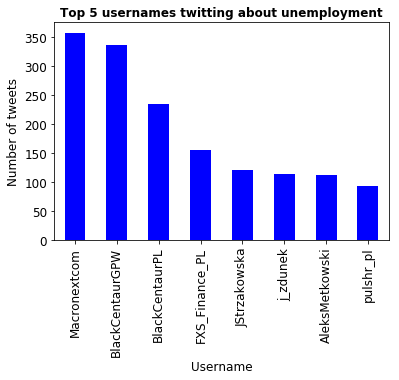

In [9]:
# Who twitted most about the unemployment in Poland from 2015 - creating a plot
# (Kto najwiecej twittowal o bezrobociu od poczatku 2015 roku) 

get_ipython().magic('matplotlib inline')
tweets_by_username = tweets['username'].value_counts()

fig, ax = plt.subplots()
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.set_xlabel('Username', fontsize=12)
ax.set_ylabel('Number of tweets' , fontsize=12)
ax.set_title('Top 5 usernames twitting about unemployment', fontsize=12, fontweight='bold')
tweets_by_username[:8].plot(ax=ax, kind='bar', color='blue')

During holidays people tweet more often

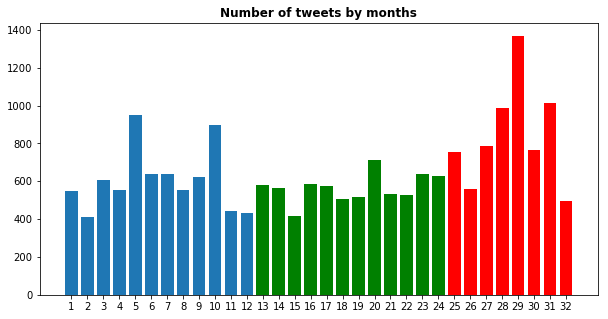

In [10]:
# Number of tweets by months - creating a plot
# (Liczba tweetow po miesiacach - wykres)

tweets['monthYear'] = tweets['date'].apply(lambda x: str(x.year)+'-'+str(x.month)+'-1')
tweets['monthYear'].unique()[0]
tweets['monthYear'] = pd.to_datetime(tweets['monthYear'])

tweets[['date', 'monthYear']].head()

yrMonthly_tweets2 = tweets.groupby(['month','year']).size().unstack()


plt.figure(figsize=(10,5))

plt.title('Number of tweets by months', fontsize=12, fontweight='bold')
plt.bar(yrMonthly_tweets2.index, yrMonthly_tweets2.values[:,0])
plt.bar(yrMonthly_tweets2.index+12, yrMonthly_tweets2.values[:,1], color='g')
plt.bar(yrMonthly_tweets2.index[:8]+24, yrMonthly_tweets2.values[:,2][~np.isnan(yrMonthly_tweets2.values[:,2])], color='r')
plt.xticks(list(yrMonthly_tweets2.index)+list(yrMonthly_tweets2.index+12)+list(yrMonthly_tweets2.index[:8]+24))
plt.show() 

x = yrMonthly_tweets2.values[:,1]
x = x[~np.isnan(x)]



People in Poland tweet mostly on Tue, Wed, Thur about unemployment

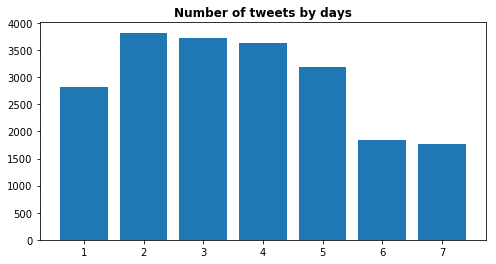

In [11]:
# Number of tweets during a day
# (liczba tweetow dziennie)

tweets['weekDay']= tweets['date'].map(lambda x: date.isocalendar(x)[2])
daily_tweets = tweets.groupby(['weekDay']).size()#.unstack()

plt.figure(figsize=(8,4))

plt.title('Number of tweets by days', fontsize=12, fontweight='bold')
plt.bar(daily_tweets.index, daily_tweets.values)
plt.xticks(daily_tweets.index)
plt.show()

# Web scraping

In [11]:
# Web scraping of dates of publication of Statistical Bulletin from the Polish Statistical Office website (stat.gov.pl)
# (pobranie daty publikacji Biuletynu Statystycznego ze strony GUS)

df = pd.DataFrame(columns=['Name','Date'])

for j in range(1,500):

    url = "http://stat.gov.pl/aktualnosci/5-years,"+str(j)+",arch.html"

    f = requests.get(url)
    soup = BeautifulSoup(f.text, 'html.parser')
    name = soup.find(text=re.compile("Biuletyn Statystyczny")) # Searching for publication

    if name !=None:

        name.strip()
        
        date = name.parent.find_next("div", class_="date").text.strip()                                                                                       
 
        df1 = pd.DataFrame({'Name':name, 'Date':[date]})
        df = df.append(df1)

# Writing the table
df = df.reset_index(drop=True)
df

,Date,Name
0,22.09.2017,Biuletyn Statystyczny Nr 8/2017
1,24.08.2017,Biuletyn Statystyczny Nr 7/2017
2,25.07.2017,Biuletyn Statystyczny Nr 6/2017
3,26.06.2017,Biuletyn Statystyczny Nr 5/2017
4,25.05.2017,Biuletyn Statystyczny Nr 4/2017
5,26.04.2017,Biuletyn Statystyczny Nr 3/2017
6,23.03.2017,Biuletyn Statystyczny Nr 2/2017
7,23.02.2017,Biuletyn Statystyczny Nr 1/2017
8,25.01.2017,Biuletyn Statystyczny Nr 12/2016
9,23.12.2016,Biuletyn Statystyczny Nr 11/2016


Sometimes the number of tweets increases after official publication of unemployment rate in Poland, but it not the rule

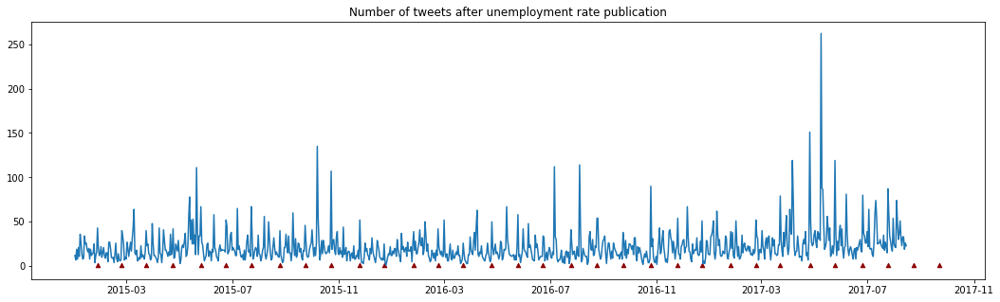

In [15]:
# Dates of publication of unemployment rate from the Statististal Bulletin from the Polish Statistical Office website (GUS)
# and number of tweets at that time of publication
# (daty publikacji stopy bezrobocia ze strony GUS i liczba tweetow w tym czasie)

nr_of_tweets = tweets.groupby('time_decoded').size() 
plt.figure(figsize=(18,5))
plt.plot(pd.to_datetime(nr_of_tweets.index), nr_of_tweets) 
official_dates = list(df['Date']) 
official_dates_stamp = pd.to_datetime(official_dates) 

# Cutting off dates below 2014 year
official_dates_stamp = official_dates_stamp[official_dates_stamp > datetime.strptime('01.01.2015', '%d.%m.%Y')]

komunikat = np.ones(len(official_dates_stamp))
plt.scatter(official_dates_stamp,komunikat, marker='^', s=20, color='darkred')
plt.title('Number of tweets after unemployment rate publication')
plt.show()

In [12]:
# This function returns True if a word ("unemployment") is found in the text, otherwise it returns False 
# (funkcja, ktora sprawdzi, czy slowo "bezrobocie" jest w tekscie tweeta)
# In 20798 tweets there is word "bezrobocie"

def word_in_text(word, text):
    word = word.lower()
    text = text.lower()
    match = re.search(word, text)
    if match:
        return True
    return False

# Next, we will add column to tweets DataFrame
tweets['bezrobocie'] = tweets['text'].apply(lambda tweet: word_in_text('bezrobocie', tweet))
print(tweets['bezrobocie'].value_counts()[True]) 

20798


In [13]:
# Number of co-occurences of phrase "unemployment in Poland" (in Polish)"
# (liczba współwystępowań slow: bezrobocie w Polsce)
# "bezrobocie w Polsce" is in 1283 tweets

counter=0
for line in tweets.iloc[:,4]:
    position =re.findall(r'(bezro.+?) (w+?) (pols.+?)', line.lower(), re.UNICODE)
    if position !=[]:
        #print(pozycja)
        counter +=1
print(counter) 

1283


In [14]:
print(range(len(tweets)))

range(0, 20803)


# Preprocessing data using NLTK:

Clean, Tokenize, Remove stopwords, Stem, Lemmatize tweets

In [15]:
# Function for "cleaning" tweets - text pre-processing
# (funkcja na "czyszczenie" tweetow)

def cleaning(s):
    s = str(s)
    s = re.sub(r'<.+?>',' ',s)  # usuniecie znacznikow html
    s = re.sub(r'\{[~\{^\{]+?\}',' ',s)  # usuniecie nawiasow klamrowych 
    s = re.sub(r'\n',' ', s) # usuniecie newlines
    s = re.sub(r'\\',' ', s) # usuniecie backslashes
    s = re.sub(r'[\,\.\"\-\']',' ',s) # usuniecie przecinkow, kropek i innych
    s = re.sub("\d+", "", s) # usuniecie cyferek
    s = re.sub('[!%@#$_]', '', s)
    s = re.sub(r'#\S+', ' ', s) # usuniecie hashtagow
    s = re.sub(r'\s{2,}',' ', s)
    return s

In [16]:
# Adding column with "cleaned" tweets
# (dodanie kolumny z "czystymi" tweetami)

tweets['cleaning'] = [cleaning(s) for s in tweets['text']]
tweets['cleaning'].head()
#type(tweets['cleaning'][0])

0    Ja oceniam fakty bezrobocie deficyt maleje mim...
1    Macronextcom informuje: W środę w kalendarium ...
2    W środę w kalendarium m in minutki FOMC PKB w ...
3    Tu i teraz to male bezrobocie duzo mniejsza ko...
4    no ba a za Gierka to się ludziom żyło I bezrob...
Name: cleaning, dtype: object

In [17]:
tweets.ix[:, ['username', 'text', 'cleaning', 'length', 'num_of_words']].head(10)

,username,text,cleaning,length,num_of_words
0,Fil_Stankiewicz,"Ja oceniam fakty - bezrobocie , deficyt maleje...",Ja oceniam fakty bezrobocie deficyt maleje mim...,141,21
1,comparic,Macronextcom informuje: W środę w #kalendarium...,Macronextcom informuje: W środę w kalendarium ...,179,24
2,Macronextcom,"W środę w #kalendarium m.in. minutki #FOMC , P...",W środę w kalendarium m in minutki FOMC PKB w ...,170,25
3,HalinkaMaria,"Tu i teraz to male bezrobocie ,duzo mniejsza k...",Tu i teraz to male bezrobocie duzo mniejsza ko...,81,13
4,KrystianU73,no ba... a za Gierka to się ludziom żyło! I be...,no ba a za Gierka to się ludziom żyło I bezrob...,140,28
5,aZyga4,"Zrozum,że ludziom żyje się lepiej.Nikt nie str...",Zrozum że ludziom żyje się lepiej Nikt nie str...,138,21
6,3DLuk,"Jest. Jest też inna sprawa, bezrobocie 4%, żyj...",Jest Jest też inna sprawa bezrobocie żyje się ...,119,20
7,adinfo24,#lubuskie W Lubuskiem Najniższe Bezrobocie W P...,lubuskie W Lubuskiem Najniższe Bezrobocie W Po...,196,16
8,JacekPlacek69,DW reprezentuje biedę. Niebawem bezrobocie :-),DW reprezentuje biedę Niebawem bezrobocie : ),46,6
9,goorakholio,Program 500 plus i niskie bezrobocie zapobiegł...,Program plus i niskie bezrobocie zapobiegły wi...,87,13


In [18]:
# Tokenizing tweets, removing Polish stopwords, punctuation
# (tokenizacja tweetow, usuniecie polskich "stopwords")

stopwords = pd.read_csv('Polish_Stopwords.txt')

def tokenizer(text):
    try:
        tokens_ = [word_tokenize(sent) for sent in sent_tokenize(text)]
        
        tokens = []
        
        for token_by_sent in tokens_:
            tokens += token_by_sent
        
        tokens = list(filter(lambda t: t.lower() not in stopwords.values, tokens))
        
        tokens = list(filter(lambda t: t not in punctuation, tokens))                     
        tokens = list(filter(lambda t: t not in [u"'s", u"n't", u"...", u"''", u'``', 
                                            u'\u2014', u'\u2026', u'\u2013'], tokens))
        
        tokens = list(filter(lambda t: '/' not in t, tokens))      
        
        tokens = list(filter(lambda t: len(t)>2, tokens))

        filtered_tokens = []
        
        for token in tokens:
            if re.search('[a-zA-Z]', token):
                filtered_tokens.append(token)

        filtered_tokens = list(map(lambda token: token.lower(), filtered_tokens))

        return filtered_tokens
    
    except Error as e:
        print(e)

In [19]:
# A new column 'tokens' is created using the map method applied to the 'cleaning' column
# The tokenizer function has been applied to each "cleaned" text through all rows 
# Each resulting value is then put into the 'tokens' column that is created after the assignment 
# (dodanie nowej kolumny z tokenami na "oczyszczonych" tweetach)

tweets['tokens'] = tweets.cleaning.map(tokenizer)


In [20]:
tweets.ix[:, ['text', 'cleaning', 'tokens']].head(10)

,text,cleaning,tokens
0,"Ja oceniam fakty - bezrobocie , deficyt maleje...",Ja oceniam fakty bezrobocie deficyt maleje mim...,"[oceniam, fakty, bezrobocie, deficyt, maleje, ..."
1,Macronextcom informuje: W środę w #kalendarium...,Macronextcom informuje: W środę w kalendarium ...,"[macronextcom, informuje, środę, kalendarium, ..."
2,"W środę w #kalendarium m.in. minutki #FOMC , P...",W środę w kalendarium m in minutki FOMC PKB w ...,"[środę, kalendarium, minutki, fomc, pkb, polsc..."
3,"Tu i teraz to male bezrobocie ,duzo mniejsza k...",Tu i teraz to male bezrobocie duzo mniejsza ko...,"[male, bezrobocie, mniejsza, korupcja, wreszci..."
4,no ba... a za Gierka to się ludziom żyło! I be...,no ba a za Gierka to się ludziom żyło I bezrob...,"[gierka, ludziom, żyło, bezrobocie, wynosiło, ..."
5,"Zrozum,że ludziom żyje się lepiej.Nikt nie str...",Zrozum że ludziom żyje się lepiej Nikt nie str...,"[zrozum, ludziom, żyje, lepiej, nikt, strzela,..."
6,"Jest. Jest też inna sprawa, bezrobocie 4%, żyj...",Jest Jest też inna sprawa bezrobocie żyje się ...,"[sprawa, bezrobocie, żyje, generalnie, ciemnog..."
7,#lubuskie W Lubuskiem Najniższe Bezrobocie W P...,lubuskie W Lubuskiem Najniższe Bezrobocie W Po...,"[lubuskie, lubuskiem, najniższe, bezrobocie, p..."
8,DW reprezentuje biedę. Niebawem bezrobocie :-),DW reprezentuje biedę Niebawem bezrobocie : ),"[reprezentuje, biedę, niebawem, bezrobocie]"
9,Program 500 plus i niskie bezrobocie zapobiegł...,Program plus i niskie bezrobocie zapobiegły wi...,"[program, plus, niskie, bezrobocie, zapobiegły..."


In [21]:
#  First 5 descriptions of text and tokens look the following:
# (5 pierwszych tweetow i tokeny tekstow)

for text, tokens in zip(tweets['text'].head(5), tweets['tokens'].head(5)):
    print('text:', text)
    print('tokens:', tokens)
    print() 

text: Ja oceniam fakty - bezrobocie , deficyt maleje mimo 500+ (nie pozwalają kraść), PKB szybko rośnie, nawiązujemy stosunki z USA,Trójmorzem itd.
tokens: ['oceniam', 'fakty', 'bezrobocie', 'deficyt', 'maleje', 'pozwalają', 'kraść', 'pkb', 'szybko', 'rośnie', 'nawiązujemy', 'stosunki', 'usa', 'trójmorzem', 'itd']

text: Macronextcom informuje: W środę w #kalendarium m.in. minutki #FOMC , PKB w Polsce i Eurolandzie, bezrobocie w #UK ,… http://www. macronext.com/pl/dane-makro/ d/2017-08-16/c/0 … ""
tokens: ['macronextcom', 'informuje', 'środę', 'kalendarium', 'minutki', 'fomc', 'pkb', 'polsce', 'eurolandzie', 'bezrobocie', 'macronext']

text: W środę w #kalendarium m.in. minutki #FOMC , PKB w Polsce i Eurolandzie, bezrobocie w #UK , zapasy ropy w #USA http://www. macronext.com/pl/dane-makro/ d/2017-08-16/c/0 …
tokens: ['środę', 'kalendarium', 'minutki', 'fomc', 'pkb', 'polsce', 'eurolandzie', 'bezrobocie', 'zapasy', 'ropy', 'usa', 'macronext']

text: Tu i teraz to male bezrobocie ,duzo 

In [22]:
# Stemming tweets and lemmatization
# (lematyzacja - sprowadzanie slow do rdzenia)
# source: https://github.com/MarcinKosinski/trigeR5/blob/master/dicts/polimorfologik-2.1.zip/polimorfologik-2.1.txt

words = pd.read_csv('polimorfologik-2.1.txt', sep=';', header=None)
words.columns
words = words.ix[:, [0,1]]
words = words.set_index([1])
dictionary = words.ix[:].to_dict(orient='dict')

In [23]:
# Function changing a word into its primary form 
# (zamiana slow na forme podstawowa)

def word_to_stem(word):
    if word in dictionary[0]:
        output = dictionary[0][word]
    else: output = word
    return output

word_to_stem('polskiego')


'polskie'

In [24]:
# Adding column with stemmed words by applying def word_to_stem on 'tokens' column
# (dodanie kolumny po lematyzacji)

tweets['stem'] = tweets['tokens'].map(lambda a: [word_to_stem(w) for w in a])

#print( tweets['tokens'][4])
#print( tweets['stem'][4])

In [25]:
tweets.ix[:, ['username', 'text', 'tokens', 'stem']].head(5)

,username,text,tokens,stem
0,Fil_Stankiewicz,"Ja oceniam fakty - bezrobocie , deficyt maleje...","[oceniam, fakty, bezrobocie, deficyt, maleje, ...","[oceniać, fakt, bezrobocie, deficyt, maleć, po..."
1,comparic,Macronextcom informuje: W środę w #kalendarium...,"[macronextcom, informuje, środę, kalendarium, ...","[macronextcom, informować, środa, kalendarium,..."
2,Macronextcom,"W środę w #kalendarium m.in. minutki #FOMC , P...","[środę, kalendarium, minutki, fomc, pkb, polsc...","[środa, kalendarium, minutka, fomc, pkb, polsc..."
3,HalinkaMaria,"Tu i teraz to male bezrobocie ,duzo mniejsza k...","[male, bezrobocie, mniejsza, korupcja, wreszci...","[male, bezrobocie, mały, korupcja, wreszcie, i..."
4,KrystianU73,no ba... a za Gierka to się ludziom żyło! I be...,"[gierka, ludziom, żyło, bezrobocie, wynosiło, ...","[gierka, ludzie, żyła, bezrobocie, wynosić, ch..."


The most common tokens are: unemployment, work, falling, Poland, the lowest

In [26]:
# Finding most_common 100 words/tokens by applying a word count function
# (znalezienie 100 najczesciej wystepujacych slow/tokenow)

def keywords():
    tokens = tweets['tokens']
    tokens_all = []
    for each_token in tokens:
        tokens_all += each_token
    counter = Counter(tokens_all)
    return counter.most_common(10)

keywords()

[('bezrobocie', 22367),
 ('pracy', 2260),
 ('spada', 2170),
 ('polsce', 1970),
 ('najniższe', 1533),
 ('proc', 1514),
 ('niskie', 1471),
 ('spadło', 1071),
 ('bit', 935),
 ('pis', 873)]

In [28]:
# Generating Word Cloud - input
# [' '.join(a) for a in tweets['stem']]

list1 = []

for a in tweets['stem']:
    list1 +=a

    list2 = ''
for a in list1:    
    list2 = list2+' '+a

In [ ]:
# Generating Word Cloud 
# (generowanie chmury słow)

#from wordcloud import WordCloud
#from PIL import Image

wordcloud = WordCloud(max_font_size=40, relative_scaling=0.3).generate(list2[:100000])
plt.figure(figsize=(12,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

# Text processing - CountVectorizer

In [27]:
# Pickling results for machine learning - backup

X = [' '.join(a) for a in tweets['stem']] 

with open('articles.txt', 'wb') as ap:
    pickle.dump(X, ap)

Converting a collection of stemmed tweets to a matrix of token counts

In [28]:
# (Konwersja kolekcji tweetów na macierz liczby tokenow)

X = [' '.join(a) for a in tweets['stem']] 

c = CountVectorizer(token_pattern='(?u)\\b\\w+\\b',min_df=3,max_df=0.5) 
# min_df=3 means "ignore terms that appear in less than 3 documents"
# max_df=0.5 means "ignore terms that appear in more than 50% of the documents"
dtm = c.fit(X)
art = dtm.transform(X) 

In [32]:
# Function for top ten words 
# (funkcja zliczaca 10 najczesciej wystepujacych słów)

def top_words(M,dtm,k):
    words = np.array(dtm.get_feature_names())
    return(np.array([words[np.squeeze(np.array(np.argsort(M[i,:].todense())))[-k:]] for i in range(M.shape[0])]))

In [33]:
top_words(art,dtm,10)

array([['rośnie', 'maleć', 'i', ..., 'tak', 'oceniać', 'deficyt'],
       ['fomc', 'kalendarium', 'pkb', ..., 'informować', 'macronext',
        'eurolandzie'],
       ['eurolandzie', 'fomc', 'ropa', ..., 'polsce', 'kalendarium', 'pkb'],
       ..., 
       ['liczbe', 'liberte', 'przyszły', ..., 'rosnąć', 'dlvr', 'zacząć'],
       ['liczbe', 'liberte', 'przyszły', ..., 'rosnąć', 'dlvr', 'zacząć'],
       ['liczbe', 'liberte', 'przyszły', ..., 'rosnąć', 'dlvr', 'zacząć']],
      dtype='<U24')

In [34]:
# Vocabulary (słownik)
vocab = c.get_feature_names()
np.array(vocab[:30])

array(['a', 'aaa', 'able', 'abomus', 'aborcja', 'absolutnie', 'absolutny',
       'absolutorium', 'absolwent', 'absolwentow', 'absurd', 'absurdalny',
       'accepted', 'acjaworski', 'acy', 'ada', 'adamdeepl', 'adamlubi',
       'adamnieznaj', 'adbodnar', 'adcdc', 'adeccopoland', 'adinfo',
       'admin', 'administracja', 'administracyjny', 'adwokat', 'adzuna',
       'afera', 'aferał'],
      dtype='<U15')

In [35]:
# Number of index(row)
# (index tj. numer wiersza)
dtm.vocabulary_['bezrobo'] 

254

In [36]:
# Visualize the most frequent 10 words
words_cv = [(w, i, art.getcol(i).sum()) for w, i in dtm.vocabulary_.items()]
words_cv = sorted(words_cv, key=lambda x: -x[2])[0:99]
words_cv[:8]

[('niski', 2866, 3774),
 ('praca', 3818, 3426),
 ('spadać', 4691, 2503),
 ('polsce', 3596, 1971),
 ('procent', 3888, 1763),
 ('spaść', 4701, 1641),
 ('mieć', 2465, 1096),
 ('polski', 3608, 936)]

# Text processing - TF IDF

Tf-idf stands for term frequencey-inverse document frequency. It's a numerical statistic intended to reflect

How important a word is to a document or a corpus (i.e a collection of documents)

In [29]:
X = [' '.join(a) for a in tweets['stem']] 

vectorizer = TfidfVectorizer(min_df=10, max_features=10000, tokenizer=tokenizer, ngram_range=(1, 1))
vz = vectorizer.fit_transform(X)
# min_df is minimum number of documents that contain a term t
# max_features is maximum number of unique tokens (across documents) that we'd consider
# TfidfVectorizer preprocesses texts using the tokenizer we defined above 

vz.shape 

(20803, 2255)

vz is a tfidf matrix:
- its number of rows is the total number of documents (list of stemmed tweets)
- its number of columns is the total number of unique terms (tokens) across the documents 

In [30]:
vz.shape[1] # number of columns 

2255

In [31]:
# Vocabulary (słownik)
words = vectorizer.get_feature_names()
words[0:5]

['abomus', 'absolwent', 'adamlubi', 'adinfo', 'administracja']

In [389]:
#vectorizer.vocabulary_

In [32]:
# Dictionary mapping the tokens to their tfidf values
tfidfy = dict(zip(vectorizer.get_feature_names(), vectorizer.idf_))
tfidfy = pd.DataFrame(columns=['tfidf']).from_dict(dict(tfidfy), orient='index')
tfidfy.columns = ['tfidf']
tfidfy.head(5)

,tfidf
narracja,8.545005
cpi,8.109687
zasilek,7.898378
sezon,8.052529
słyszeć,7.030878


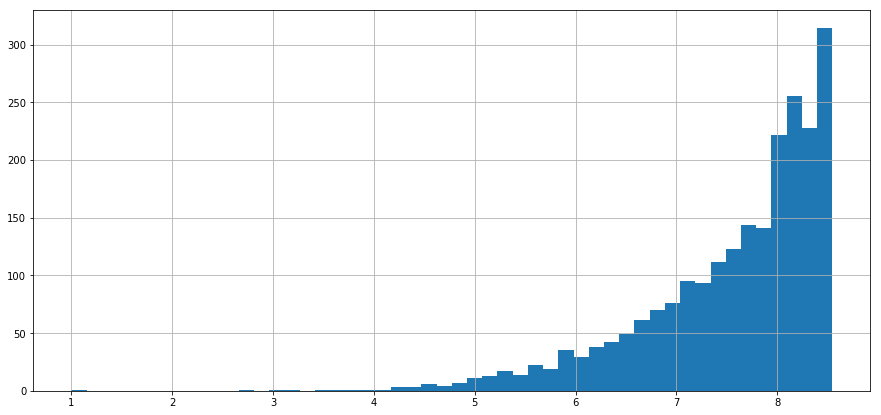

In [108]:
# Visualisation of distribution of the tfidf scores through a histogram
%matplotlib inline
tfidfy.tfidf.hist(bins=50, figsize=(15,7))

In [109]:
# Getting the tf-idf values of features (tokens that have the lowest tfidf scores)
words_tfidf = [(w, i, vz.getcol(i).sum()) for w, i in vectorizer.vocabulary_.items()]
words_tfidf = sorted(words_tfidf, key=lambda x: -x[2])[0:99]
words_tfidf[:9]

[('bezrobocie', 61, 1922.8935739355973),
 ('niski', 894, 806.60260767493071),
 ('praca', 1228, 620.39592808188968),
 ('spadać', 1543, 571.31751560605755),
 ('polsce', 1135, 519.1128755435393),
 ('spaść', 1550, 426.50019023281499),
 ('procent', 1259, 401.56973819104547),
 ('mieć', 765, 313.70874339816771),
 ('bit', 77, 290.85768176848421)]

Tokens that have the lowest tfidf scores

In [33]:
# These are very common across many tweets
tfidfy.sort_values(by=['tfidf'], ascending=True).head(10)

,tfidf
bezrobocie,1.000288
niski,2.777537
praca,2.962193
spadać,3.216688
polsce,3.476673
spaść,3.570783
procent,3.757514
mieć,4.001710
bit,4.101285
polski,4.181328


Tokens with highest tfidf scores

In [111]:
# Less common words. These words carry more meaning
tfidfy.sort_values(by=['tfidf'], ascending=False).head(10)

,tfidf
lnkd,8.545005
cztery,8.545005
import,8.545005
kapitał,8.545005
wei,8.545005
mariusz,8.545005
forma,8.545005
wyludniać,8.545005
sport,8.545005
udo,8.545005


# SVD - dimension reduction (redukcja wymiarów)

Tweets (documents) have more than 2000 features (see the vz shape), ie.each document has more than 2000 dimensions

Singular Value Decomposition (SVD) is to reduce the dimension of each vector to 50 and then using t-SNE to reduce the dimension from 50 to 2

In [34]:
# (SVD - dekompozycja, rozkład macierzy)

svd = TruncatedSVD(n_components=50, random_state=0)
svd_tfidf = svd.fit_transform(vz)
svd_tfidf.shape

svd.explained_variance_ratio_
print(svd_tfidf.shape)
len(svd_tfidf[:,1])

(20803, 50)


20803

Reducing the dimension from 50 to 2 

In [35]:
#(redukcja wymiaru z 50 do 2)

tsne_model = TSNE(n_components=2, verbose=1, random_state=0)
tsne_tfidf = tsne_model.fit_transform(svd_tfidf)

tsne_tfidf.shape

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 20803 samples in 0.145s...
[t-SNE] Computed neighbors for 20803 samples in 100.297s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20803
[t-SNE] Computed conditional probabilities for sample 2000 / 20803
[t-SNE] Computed conditional probabilities for sample 3000 / 20803
[t-SNE] Computed conditional probabilities for sample 4000 / 20803
[t-SNE] Computed conditional probabilities for sample 5000 / 20803
[t-SNE] Computed conditional probabilities for sample 6000 / 20803
[t-SNE] Computed conditional probabilities for sample 7000 / 20803
[t-SNE] Computed conditional probabilities for sample 8000 / 20803
[t-SNE] Computed conditional probabilities for sample 9000 / 20803
[t-SNE] Computed conditional probabilities for sample 10000 / 20803
[t-SNE] Computed conditional probabilities for sample 11000 / 20803
[t-SNE] Computed conditional probabilities for sample 12000 / 20803
[t-SNE] Computed conditional probabilities for s

(20803, 2)

In [36]:
# Each text is now modeled by a two dimensional vector

tsne_tfidf

array([[  6.04200935, -50.59103775],
       [ 42.62446594,  18.60392761],
       [ 41.61003113,  18.54984665],
       ..., 
       [ 45.84634399,  51.07784271],
       [ 45.84634399,  51.07784271],
       [ 45.84634399,  51.07784271]], dtype=float32)

Plotting with "Bokeh - Python interactive visualization library

In [91]:
# By hovering on each tweets cluster, we can see groups of texts of similar keywords and thus referring to the same topic
import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.plotting import figure, show, output_notebook
output_notebook()

plot_tfidf = bp.figure(plot_width=900, plot_height=700, title="tf-idf clustering of tweets",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

tfidf_df = pd.DataFrame(tsne_tfidf, columns=['x', 'y'])

tfidf_df['text'] = tweets['text']

plot_tfidf.scatter(x='x', y='y', source=tfidf_df)

bplt.figure()
hover = plot_tfidf.select(dict(type=HoverTool))
hover.tooltips={"text": "@text"}

show(plot_tfidf, notebook_handle=True)
push_notebook()

Loading BokehJS ...

# K-Means clustering (algorytm k-średnich | centroidów)

K-means clustering is a method of vector quantization that is popular for cluster analysis in data mining 

Aims to partition n observations into k clusters in which each observation belongs to the cluster with the nearest mean, serving as a prototype of the cluster

MiniBatchKMeans is an alternative implementation that does incremental updates of the centers positions using mini-batches 

In [48]:
# (Kmeans służy do podziału danych wejściowych na z góry założoną liczbę klas.) 
# (Jest to jeden z algorytmów stosowany w klasteryzacji (grupowaniu) i jest częścią uczenia nienadzorowanego w Machine Learning)

num_clusters = 5
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters, init='k-means++', n_init=1, 
                         init_size=1000, batch_size=1000, verbose=False, max_iter=1000)
kmeans = kmeans_model.fit(vz)
kmeans_clusters = kmeans.predict(vz)
kmeans_distances = kmeans.transform(vz)

Five first tweets and the associated cluster

In [49]:
for (i, desc) in enumerate(tweets.text):
    if(i < 5):
        print("Cluster " + str(kmeans_clusters[i]) + ": " + desc + 
              "(distance: " + str(kmeans_distances[i][kmeans_clusters[i]]) + ")")
        print('--------------------------')
        

Cluster 4: Ja oceniam fakty - bezrobocie , deficyt maleje mimo 500+ (nie pozwalają kraść), PKB szybko rośnie, nawiązujemy stosunki z USA,Trójmorzem itd.(distance: 0.99369603379)
--------------------------
Cluster 4: Macronextcom informuje: W środę w #kalendarium m.in. minutki #FOMC , PKB w Polsce i Eurolandzie, bezrobocie w #UK ,… http://www. macronext.com/pl/dane-makro/ d/2017-08-16/c/0 … ""(distance: 0.995735090203)
--------------------------
Cluster 4: W środę w #kalendarium m.in. minutki #FOMC , PKB w Polsce i Eurolandzie, bezrobocie w #UK , zapasy ropy w #USA http://www. macronext.com/pl/dane-makro/ d/2017-08-16/c/0 …(distance: 0.99525686255)
--------------------------
Cluster 4: Tu i teraz to male bezrobocie ,duzo mniejsza korupcja wreszcie idziemy ku dobremu(distance: 0.993760652881)
--------------------------
Cluster 4: no ba... a za Gierka to się ludziom żyło! I bezrobocie wynosiło 0%! No i chuj że do dziś spłacamy jego długi. Tak jak będą bulić nasze wnuki(distance: 0.9954516

Top features (words) that describe each cluster:

Clusters 0, 1 seem to be about low & falling unemployment in Poland

In [50]:
sorted_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]

terms = vectorizer.get_feature_names()

for i in range(num_clusters):
    print("Cluster %d:" % i, end='')
    for j in sorted_centroids[i, :10]:
        print(' %s' % terms[j], end='')
    print()


Cluster 0: spadać bezrobocie rośnie polsce praca rosnąć gospodarka bit nadal pkb
Cluster 1: spaść procent bezrobocie ift polsce praca gus poniżej poziom maj
Cluster 2: niski bezrobocie polsce rekordowy mieć bit pis poziom historia najnizsze
Cluster 3: praca bezrobocie rynek bit miejsce rynka niski polsce tysięcy dać
Cluster 4: bezrobocie procent polski wielki wysoki ludzie pis bit mieć stopa


Let's visualize the tweets, according to their distance from each centroid in K clusters

To do this, we need to reduce the dimensionality of kmeans_distances, using t-SNE again to reduce the dimensionality from 5 down to 2

In [51]:
# Reducing the dimensionality of kmeans_distances

tsne_kmeans = tsne_model.fit_transform(kmeans_distances)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 20803 samples in 0.024s...
[t-SNE] Computed neighbors for 20803 samples in 7.376s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20803
[t-SNE] Computed conditional probabilities for sample 2000 / 20803
[t-SNE] Computed conditional probabilities for sample 3000 / 20803
[t-SNE] Computed conditional probabilities for sample 4000 / 20803
[t-SNE] Computed conditional probabilities for sample 5000 / 20803
[t-SNE] Computed conditional probabilities for sample 6000 / 20803
[t-SNE] Computed conditional probabilities for sample 7000 / 20803
[t-SNE] Computed conditional probabilities for sample 8000 / 20803
[t-SNE] Computed conditional probabilities for sample 9000 / 20803
[t-SNE] Computed conditional probabilities for sample 10000 / 20803
[t-SNE] Computed conditional probabilities for sample 11000 / 20803
[t-SNE] Computed conditional probabilities for sample 12000 / 20803
[t-SNE] Computed conditional probabilities for sam

In [92]:
# Colorizing each tweet according to the cluster it belongs to - using bokeh

colormap = np.array(["#6d8dca", "#69de53", "#723bca", "#c3e14c", "#c84dc9", "#68af4e", "#6e6cd5",
"#e3be38", "#4e2d7c", "#5fdfa8", "#d34690", "#3f6d31", "#d44427", "#7fcdd8", "#cb4053", "#5e9981",
"#803a62", "#9b9e39", "#c88cca", "#e1c37b", "#34223b", "#bdd8a3", "#6e3326", "#cfbdce", "#d07d3c",
"#52697d", "#7d6d33", "#d27c88", "#36422b", "#b68f79"])

plot_kmeans = bp.figure(plot_width=700, plot_height=600, title="KMeans clustering of tweets",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

kmeans_df = pd.DataFrame(tsne_kmeans, columns=['x', 'y'])
kmeans_df['cluster'] = kmeans_clusters
kmeans_df['text'] = tweets['text']

plot_kmeans.scatter(x='x', y='y', 
                    color=colormap[kmeans_clusters], 
                    source=kmeans_df)

bplt.figure()
hover = plot_kmeans.select(dict(type=HoverTool))
hover.tooltips={"text": "@text", "cluster":"@cluster"}
show(plot_kmeans,notebook_handle=True)
push_notebook()

Clusters are separated

By hovering on each one of them you can see the corresponding texts

They deal appx. with the same topic

There are some overlaps between different clusters

# Latent Dirichlet Allocation (LDA)

Topic modeling algorithm called LDA to uncover the latent topics in tweets

The number of topics needs to be specified upfront

In [113]:
#logging.getLogger("lda").setLevel(logging.WARNING)

cvectorizer = CountVectorizer(min_df=3, max_features=10000, tokenizer=tokenizer, ngram_range=(1,1))

cvz = cvectorizer.fit_transform(tweets['text'])

n_topics = 10
n_iter = 100
lda_model = lda.LDA(n_topics=n_topics, n_iter=n_iter)
X_topics = lda_model.fit_transform(cvz)

INFO:lda:n_documents: 20803
INFO:lda:vocab_size: 7949
INFO:lda:n_words: 143622
INFO:lda:n_topics: 10
INFO:lda:n_iter: 100
INFO:lda:<0> log likelihood: -1648776
INFO:lda:<10> log likelihood: -1178859
INFO:lda:<20> log likelihood: -1147610
INFO:lda:<30> log likelihood: -1132164
INFO:lda:<40> log likelihood: -1123853
INFO:lda:<50> log likelihood: -1118194
INFO:lda:<60> log likelihood: -1113491
INFO:lda:<70> log likelihood: -1111129
INFO:lda:<80> log likelihood: -1108529
INFO:lda:<90> log likelihood: -1106490
INFO:lda:<99> log likelihood: -1104478


We can inspect the words that are most relevant to a topic

Topics are dealing mostly with: low and/or falling unemployment in Poland (topic 2), people having jobs (topic 0,8) and growing economy (topic 4, 5)

In [53]:
# Topics in more detail below

n_top_words = 8
topic_summaries = []

topic_word = lda_model.topic_word_ 
vocab = cvectorizer.get_feature_names() 
for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(' '.join(topic_words))
    print('Topic {}: {}'.format(i, ' '.join(topic_words))) 
    

Topic 0: bezrobocie pracy spada usa tys polsce miejsc osób
Topic 1: bezrobocie najniższe spada polsce pracy praca rynku poniżej
Topic 2: bezrobocie wzrost pkb niskie najniższe spada tys górę
Topic 3: bezrobocie pis spada niskie spadło rośnie gospodarka najniższe
Topic 4: bezrobocie niskie bezrobocia stopa najniższe rekordowo prognoza poprzednio
Topic 5: bezrobocie bieda chyba polsce ludzie wzrośnie wiem spadnie
Topic 6: bezrobocie proc spadło gus polsce wyniosło dane bezrobocia
Topic 7: bezrobocie wśród młodych ludzi polsce spada spadnie dzieci
Topic 8: bezrobocie pracy niskie polsce coraz spada mamy pracowników
Topic 9: bezrobocie pracy mamy polaków ludzi kraju polsce polski


In [54]:
lda_model.components_ 
lda_model.loglikelihood() 

-1103928.871618844

To visualize the tweets according to their topic distributions, we first need to reduce the dimensionality down to 2 using t-SNE

In [56]:
tsne_lda = tsne_model.fit_transform(X_topics)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 20803 samples in 0.036s...
[t-SNE] Computed neighbors for 20803 samples in 11.900s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20803
[t-SNE] Computed conditional probabilities for sample 2000 / 20803
[t-SNE] Computed conditional probabilities for sample 3000 / 20803
[t-SNE] Computed conditional probabilities for sample 4000 / 20803
[t-SNE] Computed conditional probabilities for sample 5000 / 20803
[t-SNE] Computed conditional probabilities for sample 6000 / 20803
[t-SNE] Computed conditional probabilities for sample 7000 / 20803
[t-SNE] Computed conditional probabilities for sample 8000 / 20803
[t-SNE] Computed conditional probabilities for sample 9000 / 20803
[t-SNE] Computed conditional probabilities for sample 10000 / 20803
[t-SNE] Computed conditional probabilities for sample 11000 / 20803
[t-SNE] Computed conditional probabilities for sample 12000 / 20803
[t-SNE] Computed conditional probabilities for sa

In [55]:
# Let's get the main topic for each tweet
doc_topic = lda_model.doc_topic_
lda_keys = []
for i, tweet in enumerate(tweets['text']):
    lda_keys += [doc_topic[i].argmax()]

In [ ]:
# Which we'll use to colorize them:
plot_lda = bp.figure(plot_width=700, plot_height=600, title="LDA topic visualization",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

lda_df = pd.DataFrame(tsne_lda, columns=['x','y'])
lda_df['text'] = tweets['text']

lda_df['topic'] = lda_keys
lda_df['topic'] = lda_df['topic'].map(int)

plot_lda.scatter(source=lda_df, x='x', y='y', color=colormap[lda_keys])
bplt.figure()
hover = plot_lda.select(dict(type=HoverTool))
hover.tooltips={"text":"@text", "topic":"@topic"}
show(plot_lda,notebook_handle=True)
push_notebook()

Somewhat better separation between the topics

No dominant topic

# Visualization of topics using pyLDAvis

In [ ]:
# Visualization to explore LDA topics using pyldavis
    
lda_df['len_docs'] = tweets['tokens'].map(len)

In [95]:
def prepareLDAData():
    data = {
        'vocab': vocab,
        'doc_topic_dists': lda_model.doc_topic_,
        'doc_lengths': list(lda_df['len_docs']),
        'term_frequency':cvectorizer.vocabulary_,
        'topic_term_dists': lda_model.components_
    } 
    return data

In [96]:
ldadata = prepareLDAData()

In [144]:
#import pyLDAvis

In [98]:
pyLDAvis.enable_notebook()

In [99]:
prepared_data = pyLDAvis.prepare(**ldadata)

In [100]:
pyLDAvis.save_html(prepared_data,'pyldadavis.html')

In [101]:
prepared_data

PreparedData(topic_coordinates=            Freq  cluster  topics         x         y
topic                                                
9      11.101870        1       1 -0.253756 -0.048751
8      10.682576        1       2  0.122761  0.195862
5      10.267021        1       3  0.166279 -0.139468
3      10.055929        1       4 -0.016094  0.148583
6       9.987427        1       5 -0.256967 -0.040479
0       9.894650        1       6  0.122758  0.117379
7       9.889825        1       7  0.101944 -0.187478
1       9.576136        1       8  0.069976 -0.003937
4       9.330014        1       9  0.097732 -0.089973
2       9.214552        1      10 -0.154632  0.048264, topic_info=     Category         Freq          Term         Total  loglift  logprob
term                                                                    
4600  Default  1516.000000          proc   1516.000000  30.0000  30.0000
321   Default   854.000000    bezrobocia    854.000000  29.0000  29.0000
1605  Default   789.000000           gus    789.000000  28.0000  28.0000
5593  Default  1433.000000        spadło   1433.000000  27.0000  27.0000
5573  Default  2597.000000         spada   2597.000000  26.0000  26.0000
5763  Default   647.000000         stopa    647.000000  25.0000  25.0000
3379  Default  1795.000000        niskie   1795.000000  24.0000  24.0000
7135  Default   596.000000        wzrost    596.000000  23.0000  23.0000
3148  Default  2044.000000     najniższe   2044.000000  22.0000  22.0000
3957  Default  1054.000000           pis   1054.000000  21.0000  21.0000
5085  Default   629.000000     rekordowo    629.000000  20.0000  20.0000
4537  Default  2613.000000         pracy   2613.000000  19.0000  19.0000
6252  Default   437.000000           tys    437.000000  18.0000  18.0000
4267  Default   549.000000       poniżej    549.000000  17.0000  17.0000
4007  Default   686.000000           pkb    686.000000  16.0000  16.0000
844   Default   558.000000          dane    558.000000  15.0000  15.0000
4499  Default  1055.000000         praca   1055.000000  14.0000  14.0000
2199  Default   391.000000        koniec    391.000000  13.0000  13.0000
4629  Default   295.000000      prognoza    295.000000  12.0000  12.0000
4215  Default  2312.000000        polsce   2312.000000  11.0000  11.0000
1389  Default   316.000000       finanse    316.000000  10.0000  10.0000
7025  Default   415.000000      wyniosło    415.000000   9.0000   9.0000
1304  Default   350.000000          euro    350.000000   8.0000   8.0000
4298  Default   275.000000    poprzednio    275.000000   7.0000   7.0000
1406  Default   296.000000         forex    296.000000   6.0000   6.0000
2672  Default   867.000000          mamy    867.000000   5.0000   5.0000
7186  Default   624.000000         wśród    624.000000   4.0000   4.0000
2605  Default   451.000000        ludzie    451.000000   3.0000   3.0000
4217  Default   622.000000        polska    622.000000   2.0000   2.0000
3092  Default   516.000000       młodych    516.000000   1.0000   1.0000
...       ...          ...           ...           ...      ...      ...
7157  Topic10    49.675356         węgry     51.171386   2.3547  -5.8843
3311  Topic10   175.956609        niemcy    206.118241   2.2262  -4.6195
321   Topic10   547.705916    bezrobocia    854.657111   1.9394  -3.4840
3149  Topic10    38.324232   najniższego     41.103285   2.3144  -6.1437
4448  Topic10   109.268756       poziomu    142.880694   2.1162  -5.0960
5085  Topic10   378.857948     rekordowo    629.439743   1.8767  -3.8526
5763  Topic10   387.371291         stopa    647.541065   1.8706  -3.8304
442   Topic10   102.174304       brakuje    141.836484   2.0564  -5.1631
3092  Topic10   251.157805       młodych    516.090055   1.6642  -4.2637
1770  Topic10    70.958713           iii     97.867680   2.0629  -5.5277
5350  Topic10   100.755413           rąk    159.140116   1.9273  -5.1771
4217  Topic10   255.414476        polska    622.992308   1.4927  -4.2469
7186  Topic10   251.1578

# Paragraph Vectors (doc2vec) - gensim

"Paragraph Vector is an unsupervised algorithm that learns fixed-length feature representations from variable-length pieces of texts, such as sentences, paragraphs, and documents

The algorithm represents each document by a dense vector which is trained to predict words in the document."

In [54]:
# Let's use doc2vec to created paragraph vectors for each tweet in the dataset
tknzr = TweetTokenizer()

# Let's extract the documents and tokenize them (without removing the stopwords):
docs = [TaggedDocument(tknzr.tokenize(cleaning(tweets['text'])), [i]) for i, tweet in enumerate(tweets)]

#docs[0] # here's what a tokenized document looks like

# We train our doc2vec model with 100 dimensions, a window of size 8, a minimum word count of 5 and with 4 workers
doc2vec_model = Doc2Vec(docs, size=100, window=8, min_count=5, workers=4)

Similar words to" unemployment", "falling" are: still, next, year, will be

In [60]:
doc2vec_model.most_similar(positive=["bezrobocie", "spada"], negative=["a"])

INFO:gensim.models.keyedvectors:precomputing L2-norms of word weight vectors


[('nadal', 0.9969495534896851),
 ('będzie', 0.996666669845581),
 ('roku', 0.9946973323822021),
 ('przyszłym', 0.9945772886276245),
 ('Zatrudnienie', 0.9912517070770264),
 ('Name', 0.9860072135925293),
 ('W', 0.9775710701942444),
 ('text', 0.9731534123420715),
 ('działalność', 0.9729559421539307),
 ('pracy', 0.9692236185073853)]

In [61]:
# Let' see what each paragraph vector looks like:
doc2vec_model.docvecs[0]

array([ 0.00565877, -0.00957721,  0.0037515 , -0.01878803,  0.01067011,
        0.04921692,  0.0112309 ,  0.01404925, -0.01427987, -0.01678324,
       -0.02186974, -0.02908942,  0.03864131,  0.00687068,  0.07209522,
        0.00681346,  0.01875775, -0.00132283, -0.02735531,  0.02400192,
       -0.0325469 ,  0.03687844,  0.00419842, -0.01008317,  0.01931764,
        0.0015389 , -0.03156369, -0.0166309 ,  0.01554512, -0.00527821,
        0.02345656,  0.01294275, -0.00463262, -0.03562099,  0.0079394 ,
       -0.00100975,  0.01994565,  0.02408696,  0.06773993,  0.02196833,
        0.01388542, -0.02484725, -0.02566933, -0.03643758,  0.00768691,
        0.01081785, -0.02657504, -0.02653949, -0.04213165,  0.00875287,
        0.00571962,  0.02256219, -0.0022203 ,  0.03094415,  0.03411806,
        0.03408089,  0.00094191,  0.01802771,  0.01981189, -0.00495123,
        0.0464011 ,  0.00460514,  0.01616724, -0.01652368,  0.01651226,
        0.00952248, -0.047839  ,  0.02343916,  0.02150696,  0.01

In [62]:
# Now we're going to use t-SNE to reduce dimensionality and plot the tweets:
doc_vectors = [doc2vec_model.docvecs[i] for i, t in enumerate(tweets[:10000])]

In [63]:
tsne_d2v = tsne_model.fit_transform(doc_vectors)

[t-SNE] Computing 23 nearest neighbors...
[t-SNE] Indexed 24 samples in 0.000s...
[t-SNE] Computed neighbors for 24 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 24 / 24
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 42.101044
[t-SNE] Error after 1000 iterations: 0.542235


In [124]:
# Let's put the tweets on a 2D plane:
            
plot_d2v = bp.figure(plot_width=900, plot_height=700, title="Tweets (doc2vec)",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

plot_d2v.scatter(x=tsne_d2v[:,0], y=tsne_d2v[:,1],
                    color=colormap[lda_keys][:10000],
                    source=bp.ColumnDataSource({
                        "tweet": tweets['text'],
                        "processed": tweets['cleaning']
                    })) # tweets['cleaning']

hover = plot_d2v.select(dict(type=HoverTool))
hover.tooltips={"tweet": "@tweet (processed: \"@processed\")"}
show(plot_d2v, notebook_handle=True)
push_notebook()

# LDA in gensim module

In [103]:
# Creating the term dictionary of our courpus, where every unique term is assigned an index
dictionary = corpora.Dictionary(tweets['stem'])
#dictionary.save('dictionary.dict')

# Converting list of documents (corpus) into Document Term Matrix using dictionary prepared above
corpus = [dictionary.doc2bow(text) for text in tweets['stem']]
#print(len(corpus))
mm = corpora.MmCorpus.serialize('corpus.mm', corpus)

In [56]:
dictionary.keys()[:10]  # ID words

[20894, 16038, 18688, 19106, 18950, 16949, 14697, 1194, 20921, 13438]

In [66]:
dictionary[0]   # words

'fakt'

In [29]:
x = dictionary.values()
x

ValuesView(<gensim.corpora.dictionary.Dictionary object at 0x000000001B7FD1D0>)

In [67]:
corpus[0] # documents as a tuple (id word, occurences of this word)

[(0, 1),
 (1, 1),
 (2, 1),
 (3, 1),
 (4, 1),
 (5, 1),
 (6, 1),
 (7, 1),
 (8, 1),
 (9, 1),
 (10, 1),
 (11, 1),
 (12, 1),
 (13, 1),
 (14, 1)]

In [104]:
ldamodel = LdaModel(corpus=corpus,id2word=dictionary,num_topics=10,alpha="auto")

In [33]:
ldamodel.save('lda.model')
# later on - load trained model from file
#ldamodel =  models.LdaModel.load('lda.model')

In [81]:
topics = []
for doc in corpus:
    topics.append(ldamodel[doc])

The average document mentions 5.8 topics and 77 percent of them mention 9 or fewer

In [89]:
lens = np.array([len(t) for t in topics])
print(np.mean(lens))
# the average document mentions 5.8 topics and

print(np.mean(lens <= 9))
# 77 percent of them mention 9 or fewer

5.85276162092
0.777820506658


In [99]:
# We can also ask what the most talked about topic in is. First collect some statistics on topic usage
counts = np.zeros(100)
for doc_top in topics:
    for ti,_ in doc_top:
        counts[ti] +=1
words = ldamodel.show_topic(counts.argmax(), 64)
words[0]

#Alternatively, we can look at the least talked about topic:
#words = ldamodel.show_topic(counts.argmin(), 64)

('bezrobocie', 0.13350084554378672)

In [ ]:
# Visualization of words - Word Cloud
wordcloud = WordCloud(max_font_size=40, relative_scaling=0.3).generate(str(words))
plt.figure(figsize=(12,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [71]:
ldamodel.print_topics(3)
#print(ldamodel.print_topics(num_topics=2, num_words=4))

[(5,
  '0.000*"regulować" + 0.000*"szesciu" + 0.000*"januszkrol" + 0.000*"rozdać" + 0.000*"tytu" + 0.000*"zmierzyć" + 0.000*"uzysk" + 0.000*"zabronić" + 0.000*"zdrowotny" + 0.000*"esencja"'),
 (4,
  '0.000*"larysaaa" + 0.000*"instynkt" + 0.000*"hurrraa" + 0.000*"tomaszkuzia" + 0.000*"wyrozumiałość" + 0.000*"wytłuc" + 0.000*"podbnego" + 0.000*"półautomat" + 0.000*"całiem" + 0.000*"cichaj"'),
 (0,
  '0.000*"filharmonia" + 0.000*"szamotikon" + 0.000*"matura" + 0.000*"wsród" + 0.000*"sieie" + 0.000*"faye" + 0.000*"dluk" + 0.000*"obowiazki" + 0.000*"mieszkańia" + 0.000*"bezskuteczny"')]

In [34]:
# Another way of printing topics

for i in range(0, ldamodel.num_topics-1):
    print(ldamodel.print_topic(i))

0.103*"bezrobocie" + 0.021*"spadać" + 0.016*"praca" + 0.012*"niski" + 0.011*"pis" + 0.011*"tysięcy" + 0.010*"mieć" + 0.008*"wysoki" + 0.007*"rośnie" + 0.007*"rok"
0.087*"bezrobocie" + 0.022*"news" + 0.018*"problem" + 0.016*"wśród" + 0.014*"ift" + 0.012*"młody" + 0.011*"wnp" + 0.011*"spadać" + 0.010*"lbalcerowicz" + 0.010*"debata"
0.146*"bezrobocie" + 0.047*"procent" + 0.028*"spaść" + 0.026*"niski" + 0.021*"polsce" + 0.021*"praca" + 0.018*"bit" + 0.017*"gus" + 0.017*"poziom" + 0.012*"dać"
0.093*"bezrobocie" + 0.033*"praca" + 0.018*"jednocyfrowy" + 0.010*"pracownik" + 0.009*"zmniejszać" + 0.009*"rynka" + 0.006*"kopacz" + 0.006*"raz" + 0.006*"polsce" + 0.006*"kwiecień"
0.118*"bezrobocie" + 0.039*"polsce" + 0.021*"finanse" + 0.020*"praca" + 0.019*"forex" + 0.019*"dukascopy" + 0.017*"spadać" + 0.013*"mpips" + 0.010*"bankier" + 0.010*"procent"
0.096*"bezrobocie" + 0.024*"praca" + 0.018*"młody" + 0.010*"wśród" + 0.010*"milion" + 0.009*"ludzie" + 0.009*"wysoki" + 0.009*"niski" + 0.008*"wielki"

In [35]:
ldamodel.save('topic.model')
from gensim.models import LdaModel
loading = LdaModel.load('topic.model')

In [ ]:
# print all topics
ldamodel.show_topics()

In [75]:
# show 1 topic
ldatopics = ldamodel.show_topics(formatted=False)[0]
ldatopics

(0,
 [('filharmonia', 6.2045108076142877e-05),
  ('szamotikon', 6.0044561198980051e-05),
  ('matura', 5.9963854979418218e-05),
  ('wsród', 5.8812479409184719e-05),
  ('sieie', 5.8800233200976222e-05),
  ('faye', 5.8772002233139467e-05),
  ('dluk', 5.8235043374381175e-05),
  ('obowiazki', 5.80054394870421e-05),
  ('mieszkańia', 5.7989102753270915e-05),
  ('bezskuteczny', 5.7529418498315244e-05)])

In [72]:
ldamodel.get_topic_terms(topicid=0)

[(2948, 6.2045108076142877e-05),
 (14747, 6.0044561198980051e-05),
 (6031, 5.9963854979418218e-05),
 (10445, 5.8812479409184719e-05),
 (22385, 5.8800233200976222e-05),
 (3103, 5.8772002233139467e-05),
 (16850, 5.8235043374381175e-05),
 (14121, 5.80054394870421e-05),
 (14942, 5.7989102753270915e-05),
 (21517, 5.7529418498315244e-05)]

In [74]:
ldamodel.get_document_topics(corpus[7]) # text representation

[(5, 0.45666219814858539), (9, 0.47665061991483776)]

In [ ]:
for i in range(len(tweets['stem'])):

    print(ldamodel.get_document_topics(corpus[i], minimum_probability=0))

[(0, 0.3210130903645651), (1, 0.0054805621696140758), (2, 0.25338116829680685), (3, 0.0051013002284955459), (4, 0.090314029808409177), (5, 0.22049891166954852), (6, 0.0054223567595040991), (7, 0.0051100040727525987), (8, 0.0079676937309861983), (9, 0.0857108828993179)]
[(0, 0.25509123958514296), (1, 0.0073071677783296913), (2, 0.23651940455222012), (3, 0.0068014202918278803), (4, 0.3109833355980664), (5, 0.15106798637672667), (6, 0.007229227866769267), (7, 0.0068129664693013696), (8, 0.01060946925947447), (9, 0.0075777822221412558)]
[(0, 0.35722049365656267), (1, 0.0067451376542659452), (2, 0.007236127845127705), (3, 0.0062783113555289483), (4, 0.46384928394041047), (5, 0.12892028533506897), (6, 0.0066732301912437461), (7, 0.0062889877116336203), (8, 0.0097931880317148404), (9, 0.0069949542784431889)]
[(0, 0.49626410483114297), (1, 0.010959803616168816), (2, 0.24003276286402506), (3, 0.010201269912176075), (4, 0.011349377141601162), (5, 0.020201325690445835), (6, 0.010842974453756992),

In [ ]:
# Visualizing LDA model with pyLDAvis. The area of the circles represents the prevelance of the topic
# The length of the bars on the right represents the membership of a term in a particular topic

pyLDAvis.enable_notebook()
tweets = pyLDAvis.gensim.prepare(ldamodel,corpus, dictionary)

In [37]:
tweets

PreparedData(topic_coordinates=            Freq  cluster  topics         x         y
topic                                                
0      17.040621        1       1 -0.027799 -0.080975
2      16.532923        1       2  0.211132  0.026791
5       9.424253        1       3 -0.062213  0.026389
7       9.235095        1       4 -0.068639 -0.052517
8       9.011304        1       5 -0.079031 -0.057622
3       8.447896        1       6 -0.055039 -0.016162
4       8.359691        1       7  0.173887 -0.010176
9       8.245621        1       8  0.102788 -0.000561
6       7.030825        1       9 -0.104697 -0.098671
1       6.671771        1      10 -0.090387  0.263503, topic_info=      Category          Freq          Term         Total  loglift  logprob
term                                                                      
7957   Default   1733.000000       procent   1733.000000  30.0000  30.0000
1797   Default   1781.000000        polsce   1781.000000  29.0000  29.0000
7865   Default   1311.000000           bit   1311.000000  28.0000  28.0000
5609   Default    509.000000         młody    509.000000  27.0000  27.0000
3707   Default    345.000000       finanse    345.000000  26.0000  26.0000
10511  Default    637.000000           gus    637.000000  25.0000  25.0000
3628   Default    295.000000          news    295.000000  24.0000  24.0000
21808  Default    313.000000         forex    313.000000  23.0000  23.0000
12621  Default    305.000000     dukascopy    305.000000  22.0000  22.0000
396    Default    296.000000  jednocyfrowy    296.000000  21.0000  21.0000
20825  Default    593.000000         stopa    593.000000  20.0000  20.0000
2427   Default  21041.000000    bezrobocie  21041.000000  19.0000  19.0000
16913  Default    339.000000     macronext    339.000000  18.0000  18.0000
20942  Default    454.000000         wśród    454.000000  17.0000  17.0000
9094   Default    467.000000           ift    467.000000  16.0000  16.0000
3227   Default   1478.000000         spaść   1478.000000  15.0000  15.0000
596    Default    375.000000       problem    375.000000  14.0000  14.0000
18054  Default    257.000000    komorowski    257.000000  13.0000  13.0000
4255   Default    259.000000      prognoza    259.000000  12.0000  12.0000
12680  Default    373.000000      wyniosły    373.000000  11.0000  11.0000
7384   Default    215.000000         mpips    215.000000  10.0000  10.0000
5467   Default    250.000000          euro    250.000000   9.0000   9.0000
667    Default    686.000000        poziom    686.000000   8.0000   8.0000
2515   Default   3210.000000         praca   3210.000000   7.0000   7.0000
16263  Default    468.000000       poniżej    468.000000   6.0000   6.0000
19194  Default    222.000000        strefa    222.000000   5.0000   5.0000
7191   Default    394.000000        koniec    394.000000   4.0000   4.0000
9342   Default    245.000000          góra    245.000000   3.0000   3.0000
11181  Default    355.000000         rynek    355.000000   2.0000   2.0000
14315  Default    759.000000        ludzie    759.000000   1.0000   1.0000
...        ...           ...           ...           ...      ...      ...
21587  Topic10     28.239750    antyleming     29.213813   2.6734  -6.1384
9754   Topic10     22.538046   samobójstwo     23.333949   2.6726  -6.3640
22117  Topic10     55.485163  wiceminister     57.461684   2.6723  -5.4631
15652  Topic10     22.190256  jarekkuzniar     22.985841   2.6721  -6.3795
15726  Topic10     22.596472    socjologia     23.410959   2.6719  -6.3614
19242  Topic10     66.843941         radio     69.298624   2.6712  -5.2768
4368   Topic10     22.019727         vitro     22.832175   2.6711  -6.3872
22114  Topic10     54.310429        poznać     57.482339   2.6505  -5.4845
20186  Topic10     26.474137          blog     27.566572   2.6668  -6.2030
14190  Topic10    132.057238  lbalcerowicz    144.676480   2.6160  -4.5959
10213  Topic10     45.547031        znieść     48.336745   2.6478  -5.6604
16772  To

In [38]:
pyLDAvis.save_html(tweets,'LDA-gensim.html')

# Sentiment analysis

In [37]:
# Backup for sentiment analysis
list1 = []

for a in tweets['stem']:
    list1 +=a

    list2 = ''
for a in list1:    
    list2 = list2+' '+a

Creating exemplary vocabularies for positive (pos) and negative (neg) terms in Polish

In [38]:
# choosing from list1

pos2 = ['spadać','niski','mały','najniższy','niższy','mniejszy','najmniejszy','maleć','szybko','program',
       'spaść', 'spadlo', 'zmniejszać', 'stabilizować', 'nizsze', 'zmaleć']
       
neg2 = ['bieda','biedny','ciężko','źle','zły','problem','katastrofa','zwolnić','zamykać','wyjechać',
       'wyjechalo', 'brakować', 'wyzysk', 'ruiny','ruina', 'stracony']


Counting optimism score basing on the lists above

In [39]:
pos_count = 0; neg_count = 0
for a in list1[:]:
    if a in pos2:
        pos_count +=1
    elif a in neg2:
        neg_count +=1
    else:
        pass
print(pos_count, neg_count)
print('Optimism score: {:.2f}'.format((pos_count-neg_count)/(pos_count+neg_count)))

9620 1686
Optimism score: 0.70


In [40]:
# Function for a sentiment of a tweet
# (sentiment pojedynczego tweeta)

def sentiment(s):
    pos_count = 0
    neg_count = 0
    for a in s:
    #for lst in my_list:
        if a in pos2:
            pos_count+=1
        elif a in neg2:
            neg_count += 1
        else:
            pass
    #score = (pos_count-neg_count)/(pos_count+neg_count)
    score = (pos_count-neg_count)/(pos_count+neg_count+0.0000001)
    return score

In [41]:
# The 'sentiment' function has been applied to each "stemmed" text through all rows 
# Each resulting value is then put into the 'sentiment' column that is created after the assignment 
# (dodanie nowej kolumny z sentymentem na "stemowanych" tweetach)

tweets['sentiment'] = tweets['stem'].apply(lambda a: sentiment(a))
tweets.ix[:, ['stem', 'sentiment']].head(10)

,stem,sentiment
0,"[oceniać, fakt, bezrobocie, deficyt, maleć, po...",1.000000
1,"[macronextcom, informować, środa, kalendarium,...",0.000000
2,"[środa, kalendarium, minutka, fomc, pkb, polsc...",0.000000
3,"[male, bezrobocie, mały, korupcja, wreszcie, i...",1.000000
4,"[gierka, ludzie, żyła, bezrobocie, wynosić, ch...",0.000000
5,"[zrozumieć, ludzie, żyć, lepiej, nikt, strzela...",1.000000
6,"[sprawa, bezrobocie, żyć, generalnie, ciemnogr...",-1.000000
7,"[lubuski, lubuskiem, niski, bezrobocie, polsce...",1.000000
8,"[reprezentować, bieda, niebawem, bezrobocie]",-1.000000
9,"[program, plus, niski, bezrobocie, zapobiegły,...",0.333333


In [42]:
# Rounding
tweets['sentiment'] = tweets['sentiment'].apply(lambda x: round(float(x), 0))
tweets.ix[:, ['stem', 'sentiment']].head(10)

,stem,sentiment
0,"[oceniać, fakt, bezrobocie, deficyt, maleć, po...",1.0
1,"[macronextcom, informować, środa, kalendarium,...",0.0
2,"[środa, kalendarium, minutka, fomc, pkb, polsc...",0.0
3,"[male, bezrobocie, mały, korupcja, wreszcie, i...",1.0
4,"[gierka, ludzie, żyła, bezrobocie, wynosić, ch...",0.0
5,"[zrozumieć, ludzie, żyć, lepiej, nikt, strzela...",1.0
6,"[sprawa, bezrobocie, żyć, generalnie, ciemnogr...",-1.0
7,"[lubuski, lubuskiem, niski, bezrobocie, polsce...",1.0
8,"[reprezentować, bieda, niebawem, bezrobocie]",-1.0
9,"[program, plus, niski, bezrobocie, zapobiegły,...",0.0


In [65]:
# Grouping tweets by months
# (tweety po miesiącach)
groupedMonths = tweets.groupby('monthYear')['stem'].sum()

groupedMonths = pd.DataFrame(groupedMonths)
#groupedMonths

Grouping tweets by months (increasing positive sentiment)

In [66]:
groupedMonths['sentiment'] = groupedMonths['stem'].apply(lambda a: sentiment(a))
#groupedMonths[groupedMonths['sentiment']<=0.7]

In [15]:
gus = pd.read_csv('Gus_bezrobocie.csv')

In [18]:
gus = gus.tail(10)

In [81]:
# Load the file into data frame
gus['data'] = pd.to_datetime(gus['data'])

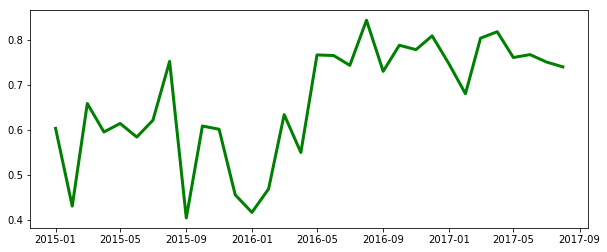

In [82]:
plt.figure(figsize=(10,4))

#plt.plot(gus.data, gus.stopa, color='r', lw=3) # not a good comparison after all 
plt.plot(groupedMonths.index, groupedMonths['sentiment'], color='g', lw=3)

plt.show()

In [67]:
# positive tweets
positive = tweets[tweets['sentiment']>0.0][['sentiment','text']]
positive.shape 

(7816, 2)

In [59]:
# neutral tweets
#neutral = tweets[tweets['sentiment']==0][['sentiment','text']]
#neutral.shape # (11942, 2)

In [68]:
# more negative tweets
negative = tweets[tweets['sentiment']<=0.0][['sentiment','text']]

negative.shape 

(12987, 2)

### HashingVectorizer

In [69]:
# Using HashingVectorizer
token = HashingVectorizer(ngram_range=(1, 1))
token

all_token = token.fit_transform(positive['text'].append(negative['text']))

all_token

<20803x1048576 sparse matrix of type '<class 'numpy.float64'>'
	with 313957 stored elements in Compressed Sparse Row format>

In [71]:
positive['text'] = 'good'
negative['text'] = 'bad'

prep = positive.append(negative)
prep.shape

(20803, 2)

### Modelling (HashingVectorizer)

In [72]:
# Modelling
X_train, X_test, y_train, y_test = train_test_split(all_token, prep['text'], random_state = 777, test_size=.25)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((15602, 1048576), (5201, 1048576), (15602,), (5201,))

In [73]:
# Implemented model: SGDClassifier - 95% accuracy
model = OneVsRestClassifier(SGDClassifier())
model
model.fit(X_train, y_train)
print(model.score(X_test, y_test))
test_prediction = model.predict(X_test)
test_prediction
y_test.head()

0.958469525091


3236    good
3632     bad
4217    good
831     good
9618     bad
Name: text, dtype: object

### Testing K-fold (HashingVectorizer)

In [75]:
# Cross validation: to ensure the models are unbiased after train-test splitting
# 10 fold testing (PassiveAggressiveClassifier)

model0= PassiveAggressiveClassifier(n_iter=1)

cv_result = cross_val_score(model0, all_token, prep['text'], cv=10)

print(cv_result)
print ('min  is %.4f'%cv_result.min())
print ('max  is %.4f'%cv_result.max())
print ('mean is %.4f'%cv_result.mean())
print ()

[ 0.96011533  0.9634791   0.96444017  0.97116771  0.97068717  0.97597309
  0.95336538  0.96248196  0.95863396  0.96103896]
min  is 0.9534
max  is 0.9760
mean is 0.9641



In [76]:
# Implemented model: LinearSVC
# Model: LinearSVC with over 97% accuracy on 25% validate dataset

model = LinearSVC(verbose = 1)

model.fit(X_train, y_train)
print ('accuracy')
print(model.score(X_test, y_test))
print(model.score(X_train, y_train))

[LibLinear]accuracy
0.976350701788
0.993526470965


In [77]:
# Modelling on full data - 99% accuracy
model_all = LinearSVC(verbose = 1)

model_all.fit(all_token, prep['text'])
print ('accuracy on train dataset')
model_all.score(all_token, prep['text'])


[LibLinear]accuracy on train dataset


0.99346248137287896

In [78]:
print(model_all.score(X_test, y_test))

0.993078254182


In [94]:
# Saving model
from sklearn.externals import joblib

from sklearn.externals import joblib
joblib.dump(token, 'token.pkl', protocol=2)
joblib.dump(model_all, 'token_SVM.pkl', protocol=2) 


['token_SVM.pkl']

In [79]:
print(classification_report(y_test, model.predict(X_test), target_names=['Negative','Positive']))

             precision    recall  f1-score   support

   Negative       0.98      0.99      0.98      3268
   Positive       0.97      0.96      0.97      1933

avg / total       0.98      0.98      0.98      5201



In [43]:
# Plotting confusion matrix

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[3219   49]
 [  74 1859]]


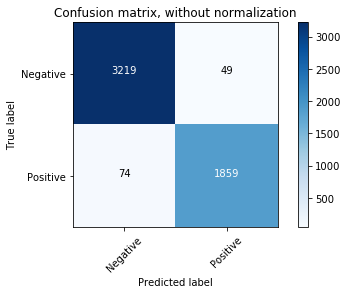

In [81]:
plot_confusion_matrix(confusion_matrix(y_test, model.predict(X_test)), 
                      classes=['Negative','Positive'],
                      title='Confusion matrix, without normalization')

In [75]:
#print(confusion_matrix(y_test, model.predict(X_test)))

In [82]:
# Function for predicting sentiment of a tweet
def pred_new(text): 
    
    text = token.transform([text]) # token is the trained tokenizer such as Hashvectorizer
    result = model_all.predict(text) # model is the trained model
    final = 'Negative' if result[0]=='bad' else 'Positive'
    return final

In [83]:
pred_new('bezrobocie spada')

'Positive'

In [84]:
pred_new('spada')

'Positive'

# Word2vec and Keras

In [44]:
# Let's make a copy of tweets data frame 
tweets2 = tweets.copy(deep=True)
tweets2.head(2)


,username,date,retweets,favorites,text,geo,mentions,hashtags,id,permalink,...,num_of_words,dummy_count,time_decoded,monthYear,weekDay,bezrobocie,cleaning,tokens,stem,sentiment
0,Fil_Stankiewicz,2017-08-15 23:19:00,0,0,"Ja oceniam fakty - bezrobocie , deficyt maleje...",NaN,NaN,NaN,897568438905909248,https://twitter.com/Fil_Stankiewicz/status/897...,...,21,1,2017-08-15,2017-08-01,2,True,Ja oceniam fakty bezrobocie deficyt maleje mim...,"[oceniam, fakty, bezrobocie, deficyt, maleje, ...","[oceniać, fakt, bezrobocie, deficyt, maleć, po...",1.0
1,comparic,2017-08-15 22:41:00,0,0,Macronextcom informuje: W środę w #kalendarium...,NaN,NaN,#kalendarium #FOMC #UK,897558901368922113,https://twitter.com/comparic/status/8975589013...,...,24,1,2017-08-15,2017-08-01,2,True,Macronextcom informuje: W środę w kalendarium ...,"[macronextcom, informuje, środę, kalendarium, ...","[macronextcom, informować, środa, kalendarium,...",0.0


In [86]:
# Remove all columns except for two columns

cols = [col for col in tweets2.columns if col in ['sentiment', 'stem']]
df2 = tweets2[cols]

In [87]:
def postprocess(data, n=100000):
    data.reset_index(inplace=True)
    data.drop('index', inplace=True, axis=1)
    return data

In [88]:
df2 = postprocess(df2)

df2.head(5)

,stem,sentiment
0,"[oceniać, fakt, bezrobocie, deficyt, maleć, po...",1.0
1,"[macronextcom, informować, środa, kalendarium,...",0.0
2,"[środa, kalendarium, minutka, fomc, pkb, polsc...",0.0
3,"[male, bezrobocie, mały, korupcja, wreszcie, i...",1.0
4,"[gierka, ludzie, żyła, bezrobocie, wynosić, ch...",0.0


In [89]:
# Let's define a training set and a test set 

xw_train, xw_test, yw_train, yw_test = train_test_split(np.array(df2.stem), np.array(df2.sentiment), test_size=0.2)

In [90]:
# Before feeding lists of tokens into the word2vec model, we must first turn them into LabeledSentence objects 

LabeledSentence = gensim.models.doc2vec.LabeledSentence

def labelizeTweets(tweets, label_type):
    labelized = []
    for i,v in enumerate(tweets):
        label = '%s_%s'%(label_type,i)
        labelized.append(LabeledSentence(v, [label]))
    return labelized

xw_train = labelizeTweets(xw_train, 'TRAIN')
xw_test = labelizeTweets(xw_test, 'TEST')

In [91]:
# Let's check the first element from x_train
# Each element is an object with two attributes: a list (of tokens) and a label

xw_train[0]

LabeledSentence(words=['móc', 'znaleźć', 'sieć', 'kiedyś', 'tvp', 'młodzieżkontra', 'rzec', 'bezrobocie', 'wśród', 'młody', 'kazać', 'studiować', 'socjologia'], tags=['TRAIN_0'])

In [92]:
# Building the word2vec model from x_train i.e. the corpus
warnings.filterwarnings("ignore")
n_dim = 200
tweet_w2v = Word2Vec(size=n_dim, min_count=10) # model is initialized with the dimension of the vector space and min_count (a threshold for filtering words that appear less)
tweet_w2v.build_vocab([x.words for x in xw_train]) # vocabulary is created
tweet_w2v.train([x.words for x in xw_train],total_examples=tweet_w2v.corpus_count, epochs=tweet_w2v.iter) # model is trained i.e. its weights are updated

465169

In [94]:
tweet_w2v.corpus_count

16642

In [95]:
# Saving the model

tweet_w2v.save('w2v.model')
# tweet_w2v = Word2Vec.load('w2v.model') # you can continue training with the loaded model

In [96]:
# Once the model is built and trained on the corpus of tweets, we can use it to convert words to vectors
# The word vectors are stored in a KeyedVectors instance in model.wv

tweet_w2v.wv['bezrobocie']  # numpy vector of a word

array([ 0.39342272, -0.26376241,  0.07222698,  0.07847665, -0.11407135,
        0.21617733, -0.20012534,  0.0701778 , -0.19926693,  0.54002911,
       -0.09099108,  0.01477663, -0.00111489,  0.34153488, -0.0168808 ,
       -0.11708311, -0.01256351, -0.07974002,  0.25827205, -0.13423115,
       -0.10196937, -0.07900395, -0.07681733, -0.2327728 ,  0.01792807,
        0.03917229,  0.09570554,  0.07567395,  0.04164417,  0.0491171 ,
       -0.13929196,  0.11059272, -0.03634775, -0.25453356, -0.17363361,
       -0.05529789,  0.19992439,  0.17153625, -0.12993012,  0.17058411,
       -0.01918065, -0.24945326, -0.1653838 ,  0.03841366, -0.18482071,
        0.33209223,  0.00477836,  0.01045694,  0.13936457,  0.32249951,
        0.10713429, -0.16069773,  0.00200553,  0.06228727, -0.10760336,
       -0.07492794, -0.21955228, -0.16162451,  0.18856783, -0.06024132,
       -0.00827936, -0.21964648, -0.08421225,  0.28570431, -0.16036716,
        0.06214326, -0.06262518, -0.00880861,  0.09704507,  0.27

In [97]:
# Word2Vec provides a method named most_similar - given a word, this method returns the top n similar ones

tweet_w2v.most_similar('bezrobocie')

[('niezalezna', 0.9861239194869995),
 ('kolejny', 0.985045313835144),
 ('sepl', 0.9848544597625732),
 ('robota', 0.9848169684410095),
 ('wgospodarce', 0.9846885204315186),
 ('węgrzech', 0.9846680164337158),
 ('superbiz', 0.9846612811088562),
 ('wpolityce', 0.9842680096626282),
 ('poinformować', 0.9842196702957153),
 ('wladzy', 0.9839668869972229)]

In [98]:
# Performing various word tasks with the model 

x5 = sorted(tweet_w2v.wv.most_similar(positive=['bezrobocie', 'spadać'], negative=['rosnąć']))
x5

[('bibliotekakp', 0.9860111474990845),
 ('bowthemes', 0.9886711835861206),
 ('dobry', 0.9850568771362305),
 ('dorzecze', 0.9858070611953735),
 ('najnizsze', 0.9908319711685181),
 ('ponizej', 0.9860296845436096),
 ('spadlo', 0.990924596786499),
 ('tvnbis', 0.9910655617713928),
 ('wynik', 0.9889716506004333),
 ('wynosić', 0.9852740168571472)]

In [99]:
x6 = sorted(tweet_w2v.wv.most_similar_cosmul(positive=['spadać'], negative=['rosnąć'])) 
x6

[('czerwiec', 1.1611460447311401),
 ('dać', 1.1570017337799072),
 ('eurostat', 1.1666394472122192),
 ('gus', 1.1704965829849243),
 ('ift', 1.1560821533203125),
 ('koniec', 1.1541105508804321),
 ('marzec', 1.1680301427841187),
 ('poniżej', 1.1623260974884033),
 ('procent', 1.1754684448242188),
 ('wyniosły', 1.1789374351501465)]

In [100]:
tweet_w2v.wv.doesnt_match("bezrobocie spadać rosnąć rafalska".split())

'rosnąć'

In [101]:
tweet_w2v.wv.similarity('bezrobocie', 'spadać')

0.91317875120968162

In [141]:
# Once the model is built and trained on the corpus of tweets, we can use it to convert words to vectors. Example:
# tweet_w2v['dobry']

In [102]:
vocab = list(tweet_w2v.wv.vocab.keys())
np.array(vocab[:10])

array(['pierdolić', 'grecki', 'usłyszeć', 'oficjalny', 'leżeć',
       'playlista', 'znakomity', 'wiedza', 'lola', 'retweeted'],
      dtype='<U9')

In [158]:
# Bokeh for vizualization of word vectors
# When clicking on a point, you can see the corresponding word

# Defining the chart
output_notebook()
plot_tfidf = bp.figure(plot_width=700, plot_height=600, title="A map of 10000 word vectors",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

# Getting a list of word vectors
word_vectors = [tweet_w2v[w] for w in list(tweet_w2v.wv.vocab.keys())[:5000]]

# Dimensionality reduction. Converting the vectors to 2d vectors
from sklearn.manifold import TSNE
tsne_model = TSNE(n_components=2, verbose=1, random_state=0)
tsne_w2v = tsne_model.fit_transform(word_vectors)

# Putting everything in a dataframe
tsne_df = pd.DataFrame(tsne_w2v, columns=['x', 'y'])
tsne_df['words'] = list(tweet_w2v.wv.vocab.keys())[:5000]

# Plotting: the corresponding word appears when you hover on the data point
plot_tfidf.scatter(x='x', y='y', source=tsne_df)
hover = plot_tfidf.select(dict(type=HoverTool))
hover.tooltips={"word": "@words"}
show(plot_tfidf, notebook_handle=True)
push_notebook()

Loading BokehJS ...

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1986 samples in 0.022s...
[t-SNE] Computed neighbors for 1986 samples in 0.880s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1986
[t-SNE] Computed conditional probabilities for sample 1986 / 1986
[t-SNE] Mean sigma: 0.032349
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.858200
[t-SNE] Error after 1000 iterations: 0.593170


In [114]:
# Building a sentiment classifier

# Compute a weighted average where each weight gives the importance of the word with respect to the corpus

vectorizer = TfidfVectorizer(analyzer=lambda x: x, min_df=10)
matrix = vectorizer.fit_transform([x.words for x in xw_train])
tfidf = dict(zip(vectorizer.get_feature_names(), vectorizer.idf_))
print('vocabulary size:', len(tfidf))

vocabulary size: 1942


In [115]:
# Let's define a function that, given a list of tweet tokens, creates an averaged tweet vector

def buildWordVector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += tweet_w2v[word].reshape((1, size)) * tfidf[word]
            count += 1.
        except KeyError: # handling the case where the token is not in the corpus
            continue
    if count != 0:
        vec /= count
    return vec

In [117]:
# Convert xw_train and xw_test into list of vectors using this function
# Scale each column to have zero mean and unit standard deviation

train_vecs_w2v = np.concatenate([buildWordVector(z, n_dim) for z in map(lambda x: x.words, xw_train)])
train_vecs_w2v = scale(train_vecs_w2v)

test_vecs_w2v = np.concatenate([buildWordVector(z, n_dim) for z in map(lambda x: x.words, xw_test)])
test_vecs_w2v = scale(test_vecs_w2v)

In [118]:
# Use classification algorithm (i.e. Stochastic Logistic Regression) on training set, then assess model performance on test set

lr = SGDClassifier(loss='log', penalty='l1')
lr.fit(train_vecs_w2v, yw_train)

print('Test Accuracy: %.2f' % lr.score(test_vecs_w2v, yw_test))

Test Accuracy: 0.84


### Keras | neural network (sieci neuronowe)

In [119]:
# Feed these vectors into a neural network classifier
# basic layer architecture (1)

model = Sequential()
model.add(Dense(32, activation='relu', input_dim=200))  # 'sigmoid'
model.add(Dense(1, activation='sigmoid'))               # 'softmax'

model.compile(optimizer='rmsprop',                      # 'adam', 'sgd'
              loss='binary_crossentropy',
              metrics=['accuracy'])

early_stoping = EarlyStopping(patience=3, monitor = "val_loss")

# Train the model, iterating on the data in batches of 32 samples
model.fit(train_vecs_w2v, yw_train, epochs=20, batch_size=32, verbose=1, 
          callbacks=None, validation_split=0.0, validation_data=None)

print(model.summary())

Epoch 1/20
16642/16642 [==============================] - 1s - loss: 0.3645 - acc: 0.7163     
Epoch 2/20
16642/16642 [==============================] - 0s - loss: 0.2352 - acc: 0.7576     
Epoch 3/20
16642/16642 [==============================] - 0s - loss: 0.1548 - acc: 0.7752     
Epoch 4/20
16642/16642 [==============================] - 0s - loss: 0.1001 - acc: 0.7881     
Epoch 5/20
16642/16642 [==============================] - 1s - loss: 0.0593 - acc: 0.7947     
Epoch 6/20
16642/16642 [==============================] - 1s - loss: 0.0275 - acc: 0.7974     
Epoch 7/20
16642/16642 [==============================] - 1s - loss: 0.0040 - acc: 0.8056     
Epoch 8/20
16642/16642 [==============================] - 1s - loss: -0.0198 - acc: 0.8066     
Epoch 9/20
16642/16642 [==============================] - 1s - loss: -0.0325 - acc: 0.8096     
Epoch 10/20
16642/16642 [==============================] - 1s - loss: -0.0465 - acc: 0.8108     
Epoch 11/20
16642/16642 [=====================

In [121]:
# Tweet sentiment classifier using word2vec and Keras - combination of these two tools resulted in a ~82% classification model accuracy

model.evaluate(test_vecs_w2v, yw_test, verbose=2)

print("Accuracy: %.2f%%" % (model.evaluate(test_vecs_w2v, yw_test, verbose=2)[1]*100))

Accuracy: 81.74%


In [122]:
model.predict(test_vecs_w2v, batch_size=32, verbose=0)

array([[  2.61519544e-05],
       [  1.62892775e-05],
       [  9.95489061e-01],
       ..., 
       [  3.32980710e-09],
       [  1.93156529e-06],
       [  1.25204787e-01]], dtype=float32)

In [123]:
# basic layer architecture (2) - worser results
from keras.models import Sequential
from keras.layers import Dense, Activation, LSTM

model = Sequential()

model.add(Dense(32, activation='sigmoid', input_dim=200))

model.add(Dense(1, activation='softmax'))

model.compile(optimizer='sgd', # 'adam', 'sgd', 'rmsprop'
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model, iterating on the data in batches of 32 samples
model.fit(train_vecs_w2v, yw_train, epochs=10, batch_size=32, verbose=1, 
          callbacks=None, validation_split=0.0, validation_data=None)

print(model.summary())

model.evaluate(test_vecs_w2v, yw_test, verbose=2)

print("Accuracy: %.2f%%" % (model.evaluate(test_vecs_w2v, yw_test, verbose=2)[1]*100))

Epoch 1/10
16642/16642 [==============================] - 1s - loss: 10.7311 - acc: 0.3775     
Epoch 2/10
16642/16642 [==============================] - 1s - loss: 10.7311 - acc: 0.3775     
Epoch 3/10
16642/16642 [==============================] - 1s - loss: 10.7311 - acc: 0.3775     
Epoch 4/10
16642/16642 [==============================] - 1s - loss: 10.7311 - acc: 0.3775     
Epoch 5/10
16642/16642 [==============================] - 1s - loss: 10.7311 - acc: 0.3775     
Epoch 6/10
16642/16642 [==============================] - 1s - loss: 10.7311 - acc: 0.3775     
Epoch 7/10
16642/16642 [==============================] - 1s - loss: 10.7311 - acc: 0.3775     
Epoch 8/10
16642/16642 [==============================] - 1s - loss: 10.7311 - acc: 0.3775     
Epoch 9/10
16642/16642 [==============================] - 1s - loss: 10.7311 - acc: 0.3775     
Epoch 10/10
16642/16642 [==============================] - 1s - loss: 10.7311 - acc: 0.3775     
_______________________________________

# Training models/predicting tweet's positive or negative sentiment


Trying to choose the best algorithm

In [45]:
# Making another copy of tweets data frame 
tweets3 = tweets.copy(deep=True)
tweets3.head(2)
tweets3.shape

(20803, 25)

In [46]:
# Binary classification of a tweet
tweets3['sentiment'] = tweets3['sentiment'].replace({-1.0: 0, 0.0: 0, 1.0: 1})
tweets3['sentiment'][:10] 

0    1.0
1    0.0
2    0.0
3    1.0
4    0.0
5    1.0
6    0.0
7    1.0
8    0.0
9    0.0
Name: sentiment, dtype: float64

### Cross validation - to select the model

Testing several algorithms using its default parameters 

Applying 10-fold cross validation on the training set to select the best method

Later on, using the grid search approach for parameters tuning 

Building and evaluating models for each combination of algorithm parameters 

In [47]:
# Creating list for best algorithms using its default parameters 
ScoreSummaryByModel = list()

In [48]:
# Function for model evaluation - based on 'cleaned', but not tokenized tweets

def ModelEvaluation (model,comment):
    
    scoring = 'accuracy'
    
    pipeline = Pipeline([('vect', CountVectorizer())
                  , ('tfidf', TfidfTransformer())
                  , ('model', model)])
    
    scores = cross_val_score(pipeline, tweets3['cleaning'], tweets3['sentiment'], cv=10, scoring=scoring) #cv=kfold 
    mean = scores.mean()
    std = scores.std()
    #The mean score and the 95% confidence interval of the score estimate (accuracy)
    ScoreSummaryByModel.append([comment,mean, std, "%0.3f (+/- %0.3f)" % (mean, std * 2)])
    print("Accuracy: %0.3f (+/- %0.3f)" % (scores.mean(), scores.std() * 2))


In [132]:
ModelEvaluation (MultinomialNB(),'Naive Bayes classifier')

Accuracy: 0.812 (+/- 0.042)


In [133]:
ModelEvaluation (BernoulliNB(binarize=0.0),'Bernoulli Naive Bayes')

Accuracy: 0.859 (+/- 0.039)


In [134]:
ModelEvaluation (SVC(kernel='linear'),'SVC, linear kernel')

Accuracy: 0.975 (+/- 0.009)


In [169]:
ModelEvaluation (LinearSVC(),'LinearSVC')

Accuracy: 0.976 (+/- 0.009)


In [168]:
ModelEvaluation (SGDClassifier(),'SGD')

Accuracy: 0.965 (+/- 0.014)


Below is the summary. LinearSVC and SVC (linear kernel) with default parameters returned the best accuracy

In [171]:
df_ScoreSummaryByModel=DataFrame(ScoreSummaryByModel,columns=['Method','Mean','Std','Accuracy'])
df_ScoreSummaryByModel.sort_values(['Mean'],ascending=False,inplace=True)
df_ScoreSummaryByModel


,Method,Mean,Std,Accuracy
3,LinearSVC,0.975820,0.004613,0.976 (+/- 0.009)
4,"SVC, linear kernel",0.975388,0.004742,0.975 (+/- 0.009)
2,SGD,0.965052,0.006787,0.965 (+/- 0.014)
1,Bernoulli Naive Bayes,0.859152,0.019505,0.859 (+/- 0.039)
0,Naive Bayes classifier,0.812233,0.020821,0.812 (+/- 0.042)


###  GridSearchCV - parameters tuning for classifiers

Using the grid search approach for parameters tuning 

Building and evaluating models for each combination of algorithm parameters

In [49]:
ScoreSummaryByModelParams = list()

In [50]:
# Function for optimizing parameters - based on 'cleaned', but not tokenized tweets

def ModelParamsEvaluation (vectorizer,model,params,comment):
    best_params = []
    scoring = 'accuracy'# 'f1'
    
    pipeline = Pipeline([
    ('vect', vectorizer),
    ('tfidf', TfidfTransformer()),
    ('clf', model),
    ])
    
    # Finding the best parameters
    grid_search = GridSearchCV(estimator=pipeline, param_grid=params, verbose=1, scoring=scoring) #cv=5, refit=True)

    grid_search.fit(tweets3['cleaning'], tweets3['sentiment'])
    best_params.append(grid_search.best_params_)
    
    print("Best score: {0}".format(grid_search.best_score_))
    print("Best parameters set:")
    
    best_parameters = grid_search.best_estimator_.get_params()
    
    for param_name in sorted(params.keys()):
        print("\t%s: %r" % (param_name, best_parameters[param_name]))
        ScoreSummaryByModelParams.append([comment,grid_search.best_score_,"\t%s: %r" % (param_name, best_parameters[param_name])])
    
    #pipeline.set_params(**best_parameters)

In [175]:
# Bernoulli Naive Bayes

p = {'vect__analyzer':('char', 'char_wb'),
    'vect__max_df': (0.5, 0.75, 1.0),
    'vect__ngram_range': ((2, 2), (3, 3)), 
    'clf__alpha': (1,0.1,0.01,0.001,0.0001,0)}

ModelParamsEvaluation(CountVectorizer(),BernoulliNB(),p,'Bernoulli Naive Bayes')

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed: 11.7min finished


Best score: 0.8239196269768784
Best parameters set:
	clf__alpha: 1
	vect__analyzer: 'char'
	vect__max_df: 0.5
	vect__ngram_range: (3, 3)


3 chars is almost a word. The score is lower then for word analyzer

In [176]:
# Bernoulli Naive Bayes, analyzer=word
p = {
    'vect__max_df': (0.5, 0.75, 1.0),
    'vect__ngram_range': ((1, 1), (3, 3), (5,5),(2,5)), 
    'clf__alpha': (1,0.1,0.01,0.001,0.0001,0)}

ModelParamsEvaluation(CountVectorizer(analyzer='word'),BernoulliNB(),p,'Bernoulli Naive Bayes, analyzer=word')

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=1)]: Done 216 out of 216 | elapsed:  9.8min finished


Best score: 0.8555496803345671
Best parameters set:
	clf__alpha: 1
	vect__max_df: 1.0
	vect__ngram_range: (1, 1)


Tweets are short messages, therefore unigrams make sense. Using unigrams seems to be the best approach

In [178]:
# LinearSVC
p = {'vect__analyzer':('char', 'char_wb'),
    'vect__max_df': (0.5, 0.75, 1.0),
    'vect__ngram_range': ((2, 2), (3, 3)),
    'clf__C': (1,0.1,0.01,0.001,0.0001)
    }
ModelParamsEvaluation(CountVectorizer(),LinearSVC(),p,'LinearSVC')

Fitting 3 folds for each of 60 candidates, totalling 180 fits


[Parallel(n_jobs=1)]: Done 180 out of 180 | elapsed:  9.8min finished


Best score: 0.9519780800846032
Best parameters set:
	clf__C: 1
	vect__analyzer: 'char_wb'
	vect__max_df: 1.0
	vect__ngram_range: (3, 3)


In [179]:
# LinearSVC, analyzer=word
p = {
    'vect__max_df': (0.5, 0.75, 1.0),
    'vect__ngram_range': ((1, 1), (3, 3), (5,5),(2,5)),
    'clf__C': (1,0.1,0.01,0.001,0.0001)
    }
ModelParamsEvaluation(CountVectorizer(analyzer='word'),LinearSVC(),p,'LinearSVC analyzer=word')

Fitting 3 folds for each of 60 candidates, totalling 180 fits


[Parallel(n_jobs=1)]: Done 180 out of 180 | elapsed:  8.2min finished


Best score: 0.9708215161274816
Best parameters set:
	clf__C: 1
	vect__max_df: 0.5
	vect__ngram_range: (1, 1)


In [183]:
# SVC, linear kernel
p = {'vect__analyzer':('char', 'char_wb'),
    'vect__max_df': (0.5, 0.75, 1.0),
    'vect__ngram_range': ((2, 2), (3, 3)),
     'clf__C': (1,0.1,0.01,0.001,0.0001)}
ModelParamsEvaluation (CountVectorizer(),SVC(kernel='linear'),p,'SVC, linear kernel, char')

Fitting 3 folds for each of 60 candidates, totalling 180 fits


[Parallel(n_jobs=1)]: Done 180 out of 180 | elapsed: 1478.7min finished


Best score: 0.9527952699129933
Best parameters set:
	clf__C: 1
	vect__analyzer: 'char_wb'
	vect__max_df: 1.0
	vect__ngram_range: (3, 3)


In [184]:
# SVC, linear kernel, analyzer=word
p = {
    'vect__max_df': (0.5, 0.75, 1.0),
    'vect__ngram_range': ((1, 1), (3, 3), (5,5),(2,5)),
    'clf__C': (1,0.1,0.01,0.001,0.0001)}
ModelParamsEvaluation (CountVectorizer(analyzer='word'),SVC(kernel='linear'),p,'SVC, linear kernel, analyzer=word')

Fitting 3 folds for each of 60 candidates, totalling 180 fits


[Parallel(n_jobs=1)]: Done 180 out of 180 | elapsed: 729.5min finished


Best score: 0.9700523962889968
Best parameters set:
	clf__C: 1
	vect__max_df: 1.0
	vect__ngram_range: (1, 1)


In [181]:
# SGDClassifier
p = {'vect__analyzer':('char', 'char_wb'),
    'vect__max_df': (0.5, 0.75, 1.0),
    'vect__ngram_range': ((2, 2), (3, 3)),
    'clf__alpha': (0.01,0.001,0.0001,0.00001, 0.000001),
    'clf__penalty': ('l1','l2', 'elasticnet')}
ModelParamsEvaluation (CountVectorizer(),SGDClassifier(),p,'SGD Classifier, analyzer=char')

Fitting 3 folds for each of 180 candidates, totalling 540 fits


[Parallel(n_jobs=1)]: Done 540 out of 540 | elapsed: 30.1min finished


Best score: 0.9571215690044705
Best parameters set:
	clf__alpha: 0.0001
	clf__penalty: 'l1'
	vect__analyzer: 'char_wb'
	vect__max_df: 1.0
	vect__ngram_range: (3, 3)


In [182]:
# SGDClassifier, analyzer='word'
p = {
    'vect__max_df': (0.5, 0.75, 1.0),
    'vect__ngram_range': ((1, 1), (3, 3), (5,5),(2,5)),
    'clf__alpha': (0.01,0.001,0.0001,0.00001, 0.000001),
    'clf__penalty': ('l1','l2', 'elasticnet')}
ModelParamsEvaluation (CountVectorizer(analyzer='word'),SGDClassifier(),p,'SGD Classifier, analyzer=word')

Fitting 3 folds for each of 180 candidates, totalling 540 fits


[Parallel(n_jobs=1)]: Done 540 out of 540 | elapsed: 24.6min finished


Best score: 0.9756285151180119
Best parameters set:
	clf__alpha: 1e-05
	clf__penalty: 'l1'
	vect__max_df: 0.5
	vect__ngram_range: (1, 1)


Below is the summary: 

The highest 97% accuracy returned:

- SGDClassifier (alpha: 1e-05, char 1-ngram)
- LinearSVC (C=1, analyzer=word, char 1-ngram)
- SVC with linear kernel (C=1, analyzer=word, char 1-ngram)

In [ ]:
# Long running time of models

In [185]:
df_ScoreSummaryByModelParams=DataFrame(ScoreSummaryByModelParams,columns=['Method','BestScore','BestParameter'])
df_ScoreSummaryByModelParams.sort_values(['BestScore'],ascending=False,inplace=True)
df_ScoreSummaryByModelParams


,Method,BestScore,BestParameter
22,"SGD Classifier, analyzer=word",0.975629,"\tvect__ngram_range: (1, 1)"
21,"SGD Classifier, analyzer=word",0.975629,\tvect__max_df: 0.5
20,"SGD Classifier, analyzer=word",0.975629,\tclf__penalty: 'l1'
19,"SGD Classifier, analyzer=word",0.975629,\tclf__alpha: 1e-05
11,LinearSVC analyzer=word,0.970822,\tclf__C: 1
12,LinearSVC analyzer=word,0.970822,\tvect__max_df: 0.5
13,LinearSVC analyzer=word,0.970822,"\tvect__ngram_range: (1, 1)"
29,"SVC, linear kernel, analyzer=word",0.970052,"\tvect__ngram_range: (1, 1)"
28,"SVC, linear kernel, analyzer=word",0.970052,\tvect__max_df: 1.0
27,"SVC, linear kernel, analyzer=word",0.970052,\tclf__C: 1


In [ ]:
# Let's apply the discovered best approach to test data set 
# Using SGDClassifier as best model
# Apply some score metrics 

In [68]:
tweet_train, tweet_test, sentiment_train, sentiment_test = train_test_split(tweets3['cleaning'], tweets3['sentiment'], test_size=0.25, random_state=42)


In [69]:
print(tweet_train.shape, tweet_test.shape, sentiment_train.shape, sentiment_test.shape)

(15602,) (5201,) (15602,) (5201,)


In [70]:
#The best result for SGD classifier, 1-1 n-grams 
sgd_pipeline = Pipeline([
    ('bow', CountVectorizer(analyzer='word',ngram_range=(1, 1), max_df=0.5)),
    ('tfidf', TfidfTransformer()), 
    ('classifier', SGDClassifier(alpha=1e-05, penalty="l1"))])

sgd_pipeline.fit(tweet_train, sentiment_train)

predictions = sgd_pipeline.predict(tweet_test)


In [85]:
# Function for metrics
def PredictionEvaluation(sentiment_test,sentiment_predictions):
    print ('Precision: %0.3f' % (precision_score(sentiment_test,sentiment_predictions)))
    print ('Accuracy: %0.3f' % (accuracy_score(sentiment_test,sentiment_predictions)))
    print ('Recall: %0.3f' % (recall_score(sentiment_test,sentiment_predictions)))
    print ('F1: %0.3f' % (f1_score(sentiment_test,sentiment_predictions)))
    print ('Confussion matrix:')
    print (confusion_matrix(sentiment_test,sentiment_predictions))
    print ('ROC-AUC: %0.3f' % (roc_auc_score(sentiment_test,sentiment_predictions)))

In [86]:
PredictionEvaluation(sentiment_test,predictions)

Precision: 0.977
Accuracy: 0.984
Recall: 0.980
F1: 0.978
Confussion matrix:
[[3195   45]
 [  40 1921]]
ROC-AUC: 0.983


In [87]:
sgd_pipeline.predict(["bezrobocie spada"])[0]

1.0

Confusion matrix, without normalization
[[3195   45]
 [  40 1921]]


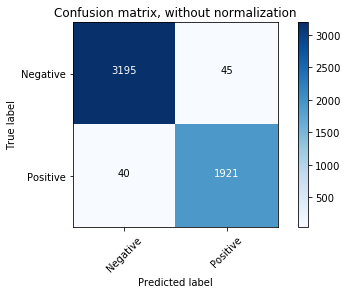

In [75]:
plot_confusion_matrix(confusion_matrix(sentiment_test, sgd_pipeline.predict(tweet_test)), 
                      classes=['Negative','Positive'],
                      title='Confusion matrix, without normalization')

In [93]:
# Final tuning parameters by pipeline - SGD Classifier
# based on 'cleaned', but not tokenized tweets
X1 = tweets3['cleaning']  
y1 = tweets3['sentiment'] 

X1_train = X[:14000]
X1_validate = X[14000:18000]
X1_test = X[18000:]

y1_train = y[:14000]
y1_validate = y[14000:18000]
y1_test = y[18000:]

pipeline1 = Pipeline([
    ('vect', CountVectorizer(analyzer='word')), 
    ('tfidf', TfidfTransformer()),
    ('clf', SGDClassifier()),
])

parameters1 = {
    'vect__max_df': (0.5, 0.75, 1.0),
    #'vect__max_features': (None, 5000, 10000, 50000),
    'vect__ngram_range': ((1, 1), (1, 2)),  # unigrams or bigrams
    #'tfidf__use_idf': (True, False),
    #'tfidf__norm': ('l1', 'l2'),
    'clf__alpha': (0.00001, 0.000001),
    'clf__penalty': ('l1', 'elasticnet'),
    #'clf__n_iter': (10, 50, 80),
}

# Find the best parameters for both the feature extraction and the classifier
# GridSearchCV - parameters tuning for choosen classifier #(szukanie optymalnej kombinacji parametrów)
grid_search1 = GridSearchCV(pipeline1, parameters1, n_jobs=2, verbose=1, 
                           scoring='accuracy')

grid_search1.fit(X1_validate, y1_validate)

# The best parameters passed back to the pipeline
print ('The best model results: %0.3f' % grid_search1.best_score_)

best_parameters1 = grid_search1.best_estimator_.get_params()

for param_name in sorted(parameters1.keys()):
    print(param_name, best_parameters1[param_name])
    
pipeline1.set_params(**best_parameters1)

# Train model on train data X_train and Y_train
pipeline1.fit(X1_train, y1_train)

y1_pred = pipeline1.predict(X1_test) # Predicting labels on 10% test data (przewidujemy etykiety na 10% zbiorze testowym)

# Calculate precision, recall, F1-score 
print(metrics.classification_report(y1_test, y1_pred, digits=3))

#print(confusion_matrix(y1_test,pipeline1.predict(X1_test)))

#print ('ROC-AUC: %0.3f' % (roc_auc_score(y1_test,y1_pred)))

Fitting 3 folds for each of 24 candidates, totalling 72 fits


[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   20.8s
[Parallel(n_jobs=2)]: Done  72 out of  72 | elapsed:   28.9s finished


The best model results: 0.942
clf__alpha 1e-05
clf__penalty elasticnet
vect__max_df 1.0
vect__ngram_range (1, 1)
             precision    recall  f1-score   support

        0.0      0.984     0.988     0.986      1993
        1.0      0.970     0.959     0.965       810

avg / total      0.980     0.980     0.980      2803



In [94]:
PredictionEvaluation(y1_test,y1_pred)

Precision: 0.970
Accuracy: 0.980
Recall: 0.959
F1: 0.965
Confussion matrix:
[[1969   24]
 [  33  777]]
ROC-AUC: 0.974


In [95]:
pipeline1.predict(["bezrobocie spada w Polsce"])[0]

1.0

In [96]:
# Final tuning parameters by pipeline - LinearSVC
# based on 'cleaned', but not tokenized tweets
X2 = tweets3['cleaning'] 
y2 = tweets3['sentiment']  

X2_train = X[:14000]
X2_validate = X[14000:18000] 
X2_test = X[18000:]

y2_train = y[:14000]
y2_validate = y[14000:18000]
y2_test = y[18000:]

pipeline2 = Pipeline([
       ('vect', TfidfVectorizer()),
       ('sel', SelectPercentile()),
       ('clf', LinearSVC())
])

parameters2 = {
   'vect__max_df': (0.25, 0.5),
   'vect__ngram_range': ((1, 1), (1, 2), (1,3)),
   'vect__use_idf': (True, False),
   'sel__percentile': (10,30,50,100),
   'clf__C': (0.01, 1, 10),
   'clf__class_weight': ('balanced',None),
}

# Find the best parameters for both the feature extraction and the classifier
# GridSearchCV - parameters tuning for choosen classifier #(szukanie optymalnej kombinacji parametrów)
grid_search2 = GridSearchCV(pipeline2, parameters2, n_jobs=2, verbose=1, 
                           scoring='accuracy')

# The best parameters passed back to the pipeline
grid_search2.fit(X2_validate, y2_validate)
print('The best model results: %0.3f' % grid_search2.best_score_)

best_parameters2 = grid_search2.best_estimator_.get_params()

for param_name in sorted(parameters2.keys()):
    print(param_name, best_parameters2[param_name])
    
pipeline2.set_params(**best_parameters2)

# Train model on train data X_train and Y_train
pipeline2.fit(X2_train, y2_train)

y2_pred = pipeline2.predict(X2_test) # Predicting labels on 10% test data (przewidujemy etykiety na 10% zbiorze testowym)

# Calculate precision, recall, F1-score 
print(metrics.classification_report(y2_test, y2_pred, digits=3))

#print(confusion_matrix(y2_test,pipeline2.predict(X2_test)))

#print ('ROC-AUC: %0.3f' % (roc_auc_score(y2_test,y2_pred)))

Fitting 3 folds for each of 288 candidates, totalling 864 fits


[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   18.4s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   41.4s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:  1.3min
[Parallel(n_jobs=2)]: Done 796 tasks      | elapsed:  2.3min
[Parallel(n_jobs=2)]: Done 864 out of 864 | elapsed:  2.5min finished


The best model results: 0.970
clf__C 10
clf__class_weight balanced
sel__percentile 10
vect__max_df 0.5
vect__ngram_range (1, 1)
vect__use_idf False
             precision    recall  f1-score   support

        0.0      0.992     0.989     0.991      1993
        1.0      0.974     0.981     0.978       810

avg / total      0.987     0.987     0.987      2803



In [97]:
PredictionEvaluation(y2_test,y2_pred)

Precision: 0.974
Accuracy: 0.987
Recall: 0.981
F1: 0.978
Confussion matrix:
[[1972   21]
 [  15  795]]
ROC-AUC: 0.985


In [108]:
# Final tuning parameters by pipeline - SGD Classifier (only on train, test data set) + cross validation
# based on 'cleaned', but not tokenized tweets
msg_train, msg_test, label_train, label_test = train_test_split(tweets3['cleaning'], tweets3['sentiment'], 
                                                                  test_size=0.2, random_state=42)

print(len(msg_train), len(msg_test), len(msg_train) + len(msg_test))

pipeline_sgd = Pipeline([
    ('vect', CountVectorizer(analyzer='word')),
    ('tfidf', TfidfTransformer()),
    ('clf', SGDClassifier()),
])

# pipeline parameters to automatically explore and tune
parameters_sgd = {
    'vect__max_df': (0.5, 0.75, 1.0),
    #'vect__max_features': (None, 5000, 10000, 50000),
    'vect__ngram_range': ((1, 1), (1, 2)),  # unigrams or bigrams
    #'tfidf__use_idf': (True, False),
    #'tfidf__norm': ('l1', 'l2'),
    'clf__alpha': (0.00001, 0.000001),
    'clf__penalty': ('l1', 'elasticnet'),
    #'clf__n_iter': (10, 50, 80),
}

results_sgd = []

cv_results_sgd = cross_val_score(pipeline_sgd,  
                         msg_train,  # training data
                         label_train,  # training labels
                         cv=10,  # split data randomly into 10 parts: 9 for training, 1 for scoring or cv=kfold
                         scoring='accuracy',  # scoring metric
                         n_jobs=-1,  # -1 = use all cores = faster
                         )

results_sgd.append(cv_results_sgd)
#print(cv_results_sgd) 

msg_sgd = "%f (%f)" % (cv_results_sgd.mean(), cv_results_sgd.std())
#print(msg_sgd)

grid_sgd = GridSearchCV(
    pipeline_sgd,  # pipeline from above
    param_grid=parameters_sgd,  # parameters to tune via cross validation
    refit=True,  # fit using all data, on the best detected classifier
    n_jobs=-1,  # number of cores to use for parallelization; -1 for "all cores"
    scoring='accuracy',  # scores we are optimizing
    cv=StratifiedKFold(label_train, n_folds=5),  # type of cross validation to use
)

grid_sgd.fit(msg_train, label_train)    
print('The best model results: %0.3f' % grid_sgd.best_score_)

best_parameters_sgd = grid_sgd.best_estimator_.get_params()

for param_name in sorted(parameters_sgd.keys()):
    print(param_name, best_parameters_sgd[param_name])
    
pipeline_sgd.set_params(**best_parameters_sgd)

pipeline_sgd.fit(msg_train, label_train)  

y_pred_sgd = pipeline_sgd.predict(msg_test)     
print(metrics.classification_report(label_test, y_pred_sgd, digits=3)) 

16642 4161 20803
The best model results: 0.980
clf__alpha 1e-05
clf__penalty elasticnet
vect__max_df 1.0
vect__ngram_range (1, 1)
             precision    recall  f1-score   support

        0.0      0.993     0.988     0.990      2596
        1.0      0.980     0.988     0.984      1565

avg / total      0.988     0.988     0.988      4161



In [109]:
PredictionEvaluation(label_test,y_pred_sgd)

Precision: 0.980
Accuracy: 0.988
Recall: 0.988
F1: 0.984
Confussion matrix:
[[2564   32]
 [  19 1546]]
ROC-AUC: 0.988


In [110]:
grid_sgd.predict(["bezrobocie spada"])[0]

1.0